<a href="https://colab.research.google.com/github/saugata-malakar/ML-CaPsule/blob/master/The_CampusPulse_Initiative.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:


import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import keras

In [2]:
import pandas as pd

# Load the dataset
df = pd.read_csv("/content/Dataset (2).csv")  # Adjust the path if needed

# Show the first 5 rows
df.head()


,school,sex,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,...,Dalc,health,absences,G1,G2,G3,Feature_1,Feature_2,Feature_3,romantic
0,GP,F,U,GT3,A,4,4.0,at_home,teacher,course,...,1,3,4.0,0,11.0,11,18.0,2.0,1.0,no
1,GP,F,U,GT3,T,1,1.0,at_home,other,course,...,1,3,2.0,9,11.0,11,17.0,2.0,1.0,no
2,GP,F,U,LE3,T,1,1.0,at_home,other,other,...,2,3,6.0,12,13.0,12,15.0,NaN,3.0,no
3,GP,F,U,GT3,T,4,2.0,health,services,home,...,1,5,0.0,14,14.0,14,15.0,3.0,1.0,yes
4,GP,F,U,GT3,T,3,3.0,other,other,home,...,1,5,0.0,11,13.0,13,16.0,NaN,2.0,no


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   school      649 non-null    object 
 1   sex         649 non-null    object 
 2   address     649 non-null    object 
 3   famsize     599 non-null    object 
 4   Pstatus     649 non-null    object 
 5   Medu        649 non-null    int64  
 6   Fedu        576 non-null    float64
 7   Mjob        649 non-null    object 
 8   Fjob        649 non-null    object 
 9   reason      649 non-null    object 
 10  guardian    649 non-null    object 
 11  traveltime  576 non-null    float64
 12  failures    649 non-null    int64  
 13  schoolsup   649 non-null    object 
 14  famsup      649 non-null    object 
 15  paid        649 non-null    object 
 16  activities  649 non-null    object 
 17  nursery     649 non-null    object 
 18  higher      573 non-null    object 
 19  internet    649 non-null    o

In [5]:
df.describe()

,Medu,Fedu,traveltime,failures,famrel,freetime,goout,Dalc,health,absences,G1,G2,G3,Feature_1,Feature_2,Feature_3
count,649.000000,576.000000,576.000000,649.000000,649.000000,604.000000,649.000000,649.000000,649.000000,580.000000,649.000000,614.000000,649.000000,611.000000,603.000000,610.000000
mean,2.514638,2.303819,1.574653,0.221880,3.930663,3.172185,3.184900,1.502311,3.536210,3.746552,11.399076,11.586319,11.906009,16.747954,1.913765,2.262295
std,1.134552,1.111076,0.744592,0.593235,0.955717,1.044684,1.175766,0.924834,1.446259,4.732890,2.745265,2.927878,3.230656,1.216812,0.830798,1.285279
min,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,15.000000,1.000000,1.000000
25%,2.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,2.000000,0.000000,10.000000,10.000000,10.000000,16.000000,1.000000,1.000000
50%,2.000000,2.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,4.000000,2.000000,11.000000,11.000000,12.000000,17.000000,2.000000,2.000000
75%,4.000000,3.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,5.000000,6.000000,13.000000,13.000000,14.000000,18.000000,2.000000,3.000000
max,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,32.000000,19.000000,19.000000,19.000000,22.000000,4.000000,5.000000


In [6]:
# Check for missing values
df.isnull().sum().sort_values(ascending=False)


,0
higher,76
traveltime,73
Fedu,73
absences,69
famsize,50
Feature_2,46
freetime,45
Feature_3,39
Feature_1,38
G2,35


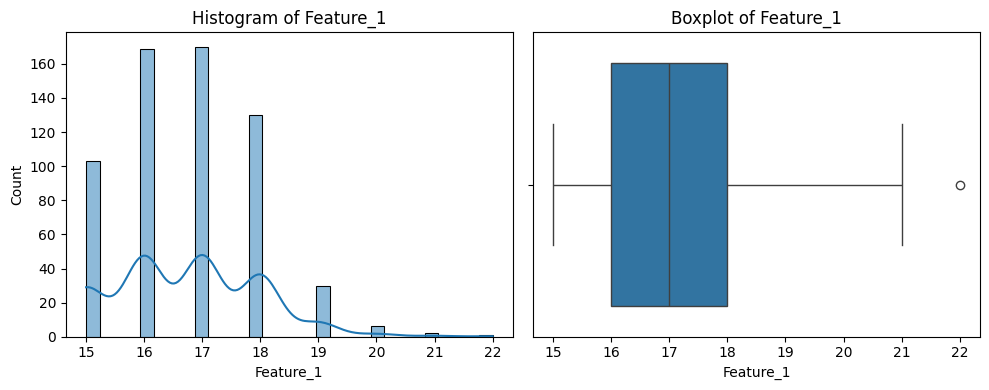

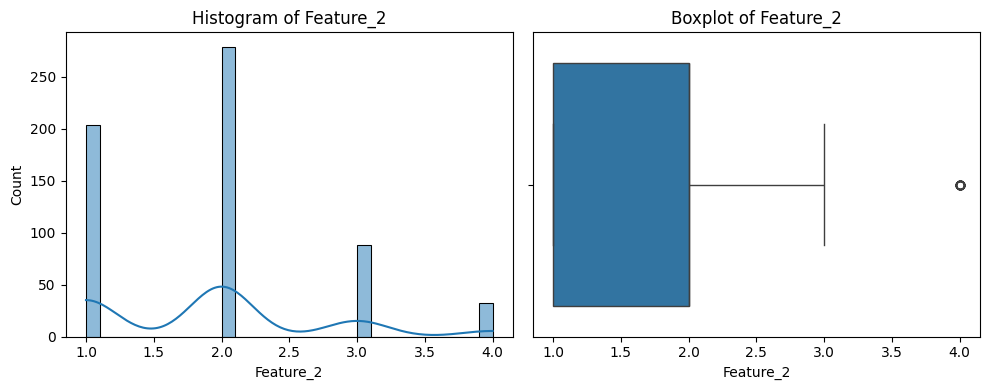

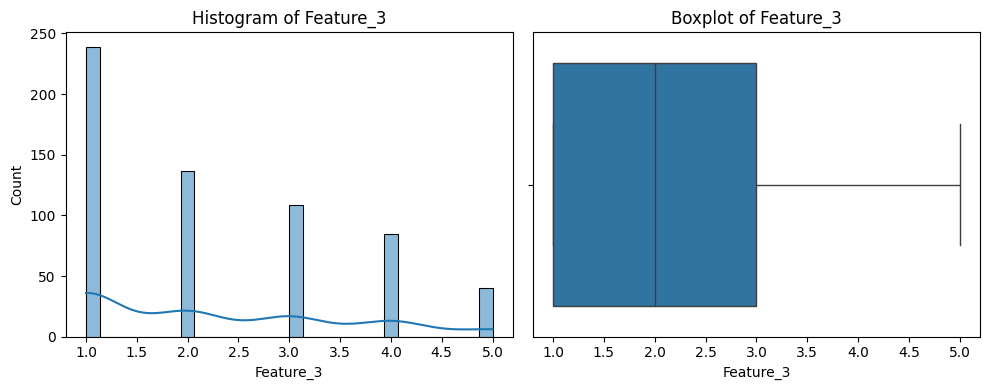

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['Feature_1', 'Feature_2', 'Feature_3']

for feature in features:
    plt.figure(figsize=(10, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[feature], kde=True, bins=30)
    plt.title(f"Histogram of {feature}")

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[feature])
    plt.title(f"Boxplot of {feature}")

    plt.tight_layout()
    plt.show()


<ipython-input-8-ac5915b3e62b>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  binary_df.replace({'yes': 1, 'no': 0}, inplace=True)


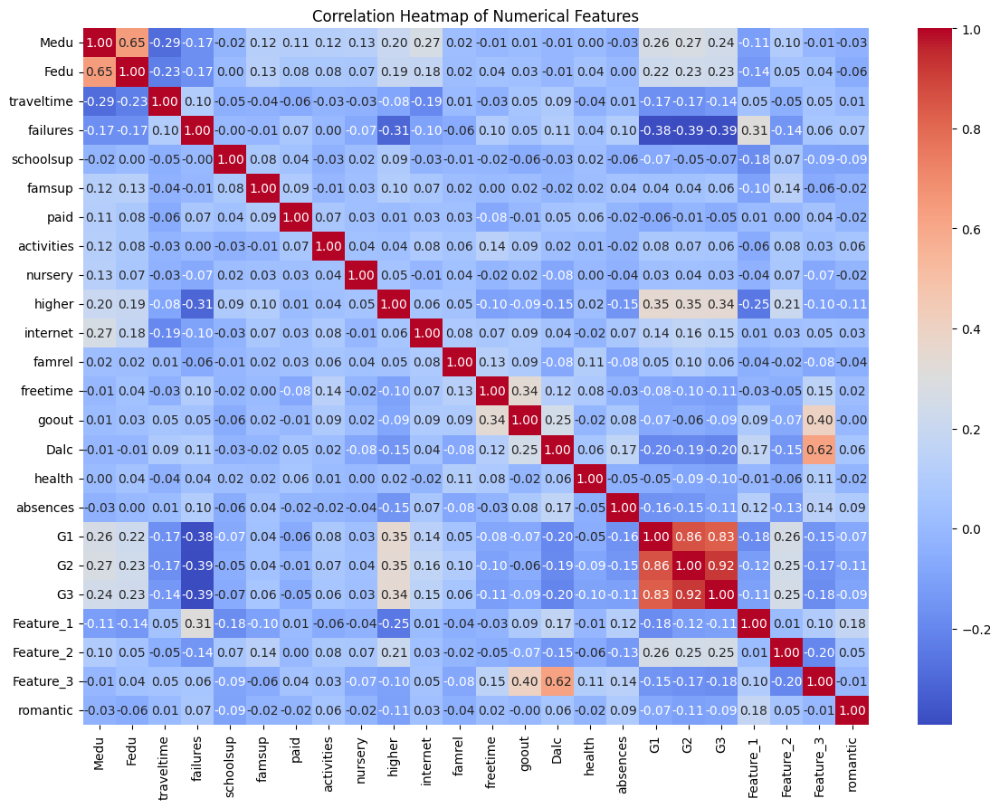

In [8]:
# Convert 'yes'/'no' to 1/0 for correlation analysis
binary_df = df.copy()
binary_df.replace({'yes': 1, 'no': 0}, inplace=True)

# Select numeric columns only
numeric_cols = binary_df.select_dtypes(include=['int64', 'float64']).columns

# Correlation matrix
plt.figure(figsize=(14, 10))
sns.heatmap(binary_df[numeric_cols].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numerical Features")
plt.show()


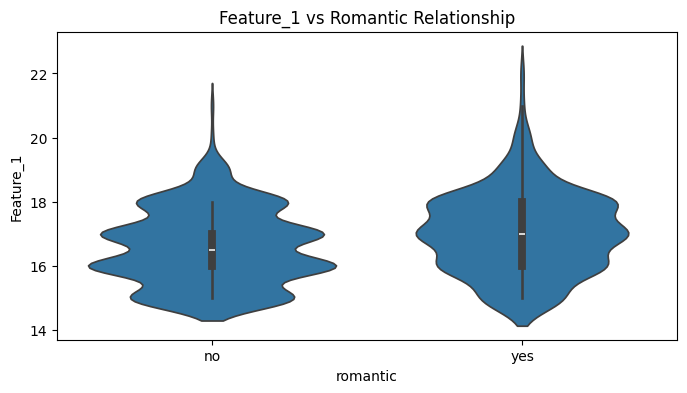

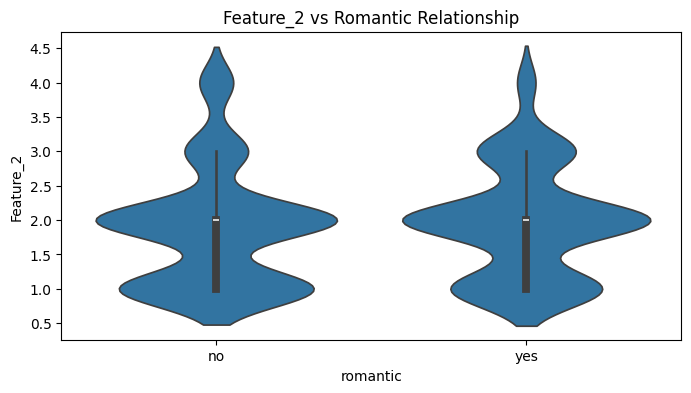

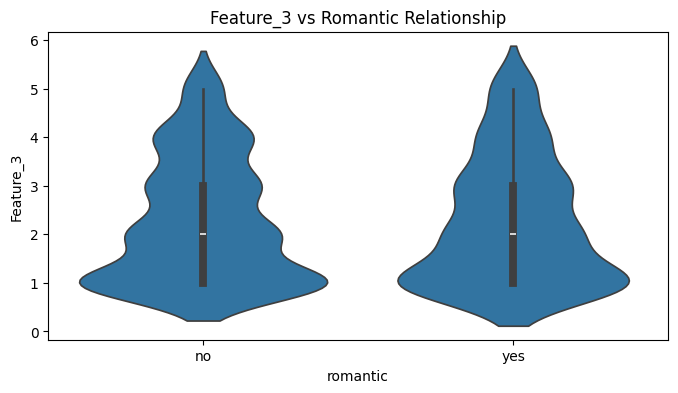

In [9]:
# Violin plots to compare distribution by romantic relationship
for feature in features:
    plt.figure(figsize=(8, 4))
    sns.violinplot(x='romantic', y=feature, data=df)
    plt.title(f"{feature} vs Romantic Relationship")
    plt.show()


In [10]:
# Overview of data types and missing values
df.info()

# Check for missing values
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   school      649 non-null    object 
 1   sex         649 non-null    object 
 2   address     649 non-null    object 
 3   famsize     599 non-null    object 
 4   Pstatus     649 non-null    object 
 5   Medu        649 non-null    int64  
 6   Fedu        576 non-null    float64
 7   Mjob        649 non-null    object 
 8   Fjob        649 non-null    object 
 9   reason      649 non-null    object 
 10  guardian    649 non-null    object 
 11  traveltime  576 non-null    float64
 12  failures    649 non-null    int64  
 13  schoolsup   649 non-null    object 
 14  famsup      649 non-null    object 
 15  paid        649 non-null    object 
 16  activities  649 non-null    object 
 17  nursery     649 non-null    object 
 18  higher      573 non-null    object 
 19  internet    649 non-null    o

In [11]:
# Summary statistics for numeric columns
df.describe()

# Summary for categorical columns
df.describe(include='object')


,school,sex,address,famsize,Pstatus,Mjob,Fjob,reason,guardian,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic
count,649,649,649,599,649,649,649,649,649,649,649,649,649,649,573,649,649
unique,2,2,2,2,2,5,5,4,3,2,2,2,2,2,2,2,2
top,GP,F,U,GT3,T,other,other,course,mother,no,yes,no,no,yes,yes,yes,no
freq,423,383,452,424,569,258,367,285,455,581,398,610,334,521,509,498,410


In [12]:
# Strip whitespaces from column names (in case any)
df.columns = df.columns.str.strip()

# Convert all categorical "yes"/"no" to 1/0
binary_map = {'yes': 1, 'no': 0}
binary_columns = ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']
df[binary_columns] = df[binary_columns].replace(binary_map)

# Convert gender to binary
df['sex'] = df['sex'].map({'F': 0, 'M': 1})

# Encode 'school' and 'address' (GP=0, MS=1; U=0, R=1)
df['school'] = df['school'].map({'GP': 0, 'MS': 1})
df['address'] = df['address'].map({'U': 0, 'R': 1})

# Display updated data types
df.dtypes


<ipython-input-12-08d55928ff26>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[binary_columns] = df[binary_columns].replace(binary_map)


,0
school,int64
sex,int64
address,int64
famsize,object
Pstatus,object
Medu,int64
Fedu,float64
Mjob,object
Fjob,object
reason,object


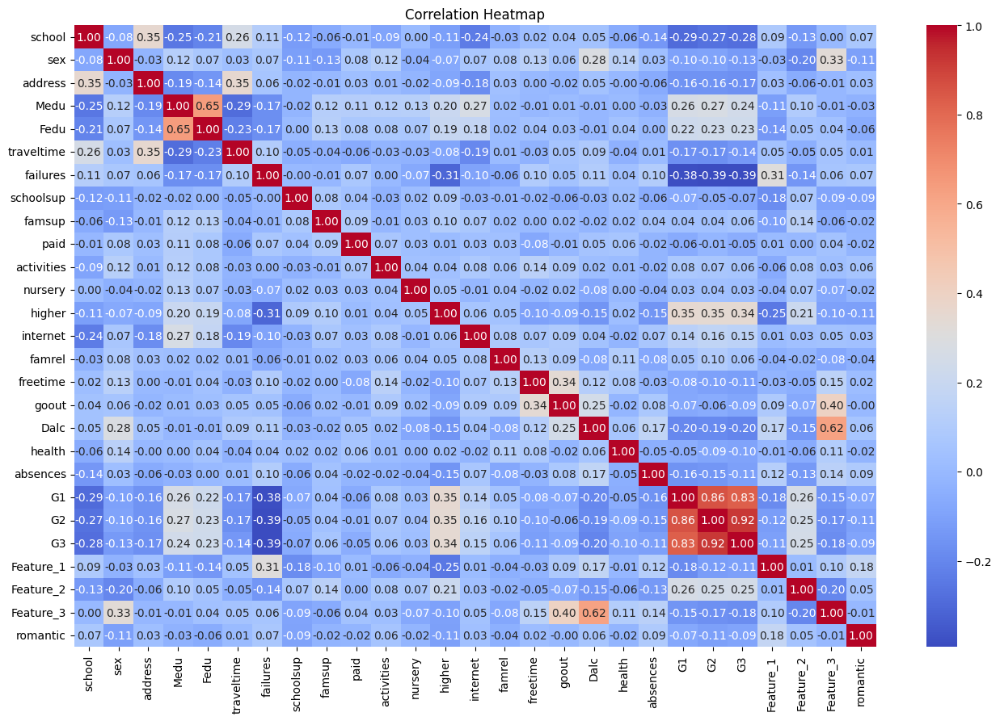

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Only select numeric columns
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(numeric_df.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()


In [14]:
# Convert all 'yes'/'no' binary columns to 1/0
binary_map = {'yes': 1, 'no': 0}
binary_cols = ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']

for col in binary_cols:
    df[col] = df[col].map(binary_map)


In [15]:
# Check for missing values again
missing = df.isnull().sum()
print("Missing Values:\n", missing[missing > 0])

# Example imputation strategies
# For categorical: Fill with mode
cat_cols = df.select_dtypes(include='object').columns
for col in cat_cols:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].mode()[0], inplace=True)

# For numeric: Fill with median
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].median(), inplace=True)


Missing Values:
 famsize        50
Fedu           73
traveltime     73
schoolsup     649
famsup        649
paid          649
activities    649
nursery       649
higher        649
internet      649
freetime       45
absences       69
G2             35
Feature_1      38
Feature_2      46
Feature_3      39
romantic      649
dtype: int64


<ipython-input-15-5b5c3055a3e9>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
<ipython-input-15-5b5c3055a3e9>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usi

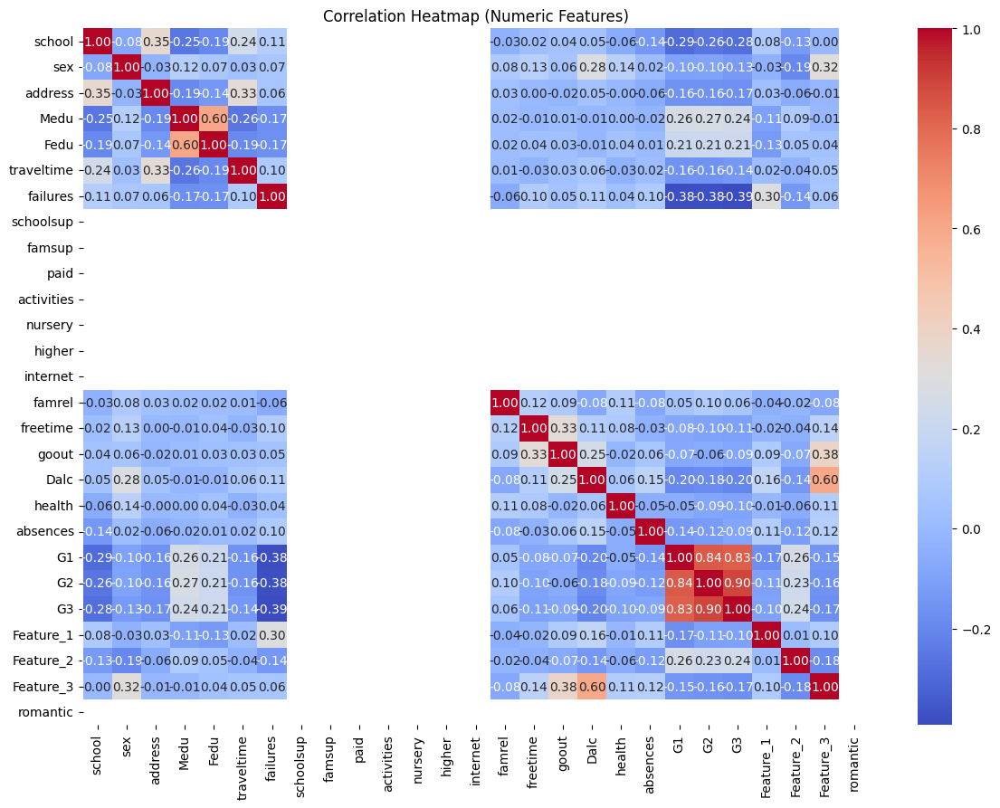

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,10))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap (Numeric Features)")
plt.show()


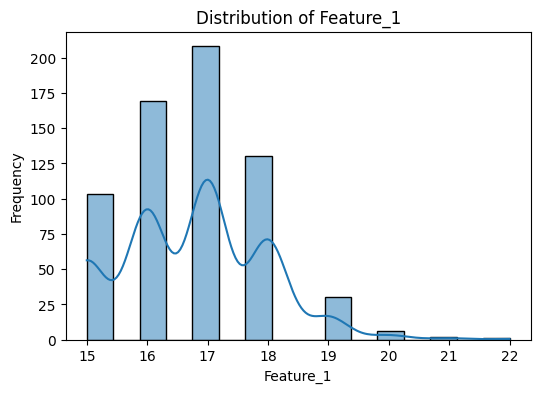

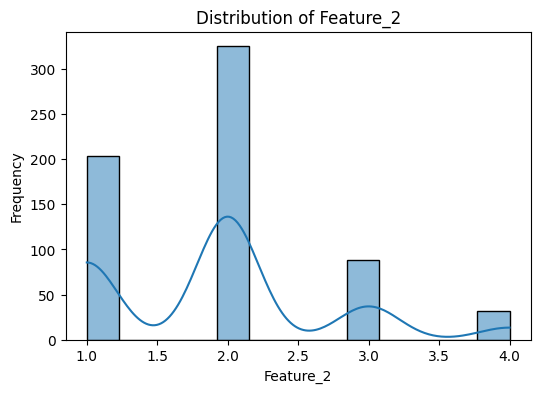

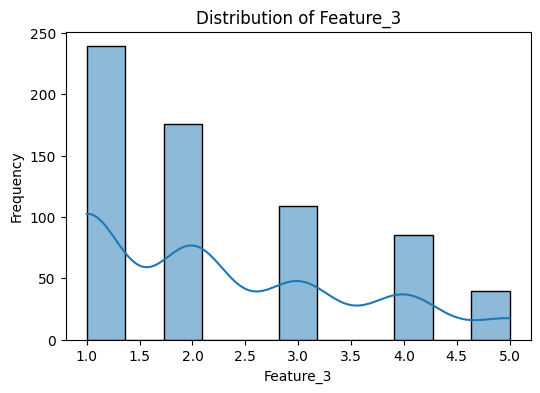

In [17]:
# Visual inspection of anonymized features
import matplotlib.pyplot as plt

anon_cols = ['Feature_1', 'Feature_2', 'Feature_3']
for col in anon_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


In [18]:
# Correlation with anonymized features
anon_features = ['Feature_1', 'Feature_2', 'Feature_3']
correlations = df.corr(numeric_only=True)[anon_features].sort_values(by=anon_features, ascending=False)
print("Correlation of anonymized features with other numeric features:\n")
print(correlations)


Correlation of anonymized features with other numeric features:

            Feature_1  Feature_2  Feature_3
Feature_1    1.000000   0.014115   0.095191
failures     0.297461  -0.141136   0.059425
Dalc         0.164249  -0.141393   0.597375
absences     0.109621  -0.115785   0.118660
Feature_3    0.095191  -0.184033   1.000000
goout        0.092685  -0.067807   0.381285
school       0.081125  -0.128861   0.000736
address      0.030488  -0.059515  -0.012277
traveltime   0.017194  -0.035838   0.053603
Feature_2    0.014115   1.000000  -0.184033
health      -0.007604  -0.060096   0.105378
freetime    -0.021125  -0.041380   0.140241
sex         -0.028862  -0.194476   0.315215
famrel      -0.043272  -0.019362  -0.076242
G3          -0.102429   0.235604  -0.171902
Medu        -0.106721   0.092982  -0.005824
G2          -0.110171   0.227623  -0.160872
Fedu        -0.127287   0.049528   0.041024
G1          -0.173833   0.255255  -0.146374
schoolsup         NaN        NaN        NaN
famsup     

<ipython-input-19-c8d004b4e197>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, x=feature, y='G3', hue='romantic', palette='Set1')


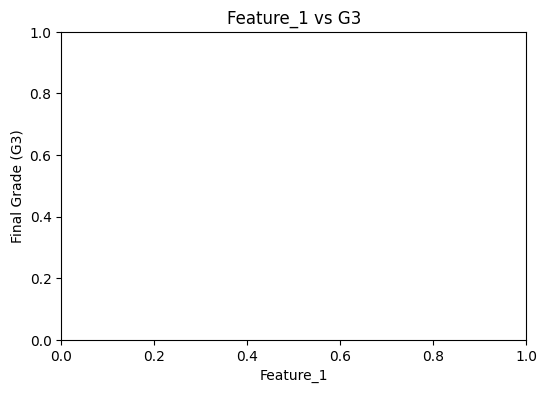

<ipython-input-19-c8d004b4e197>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, x=feature, y='G3', hue='romantic', palette='Set1')


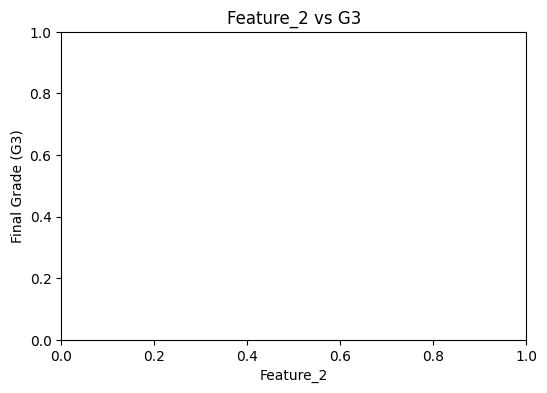

<ipython-input-19-c8d004b4e197>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df, x=feature, y='G3', hue='romantic', palette='Set1')


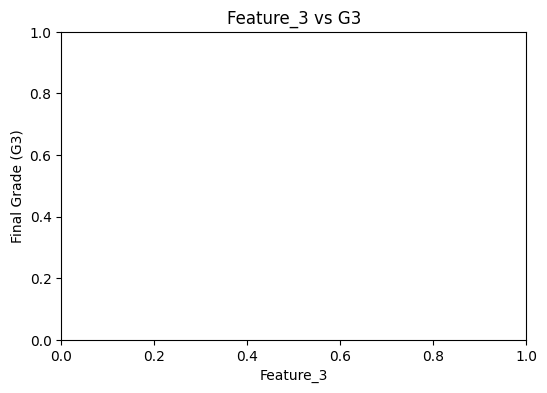

In [19]:
# Scatterplots of anonymized features vs final grade (G3)
for feature in anon_features:
    plt.figure(figsize=(6,4))
    sns.scatterplot(data=df, x=feature, y='G3', hue='romantic', palette='Set1')
    plt.title(f'{feature} vs G3')
    plt.xlabel(feature)
    plt.ylabel('Final Grade (G3)')
    plt.show()


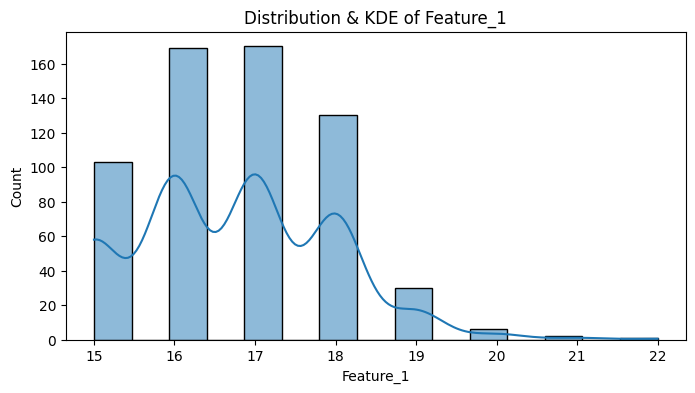

Shapiro-Wilk Test for Feature_1: stat=0.9157, p=0.0000 (p<0.05 means non-normal)


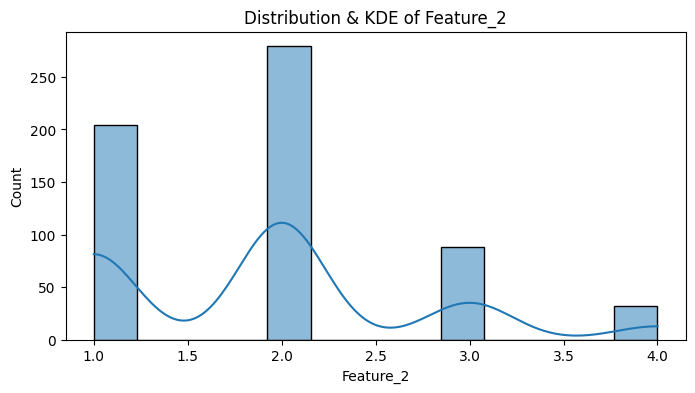

Shapiro-Wilk Test for Feature_2: stat=0.8226, p=0.0000 (p<0.05 means non-normal)


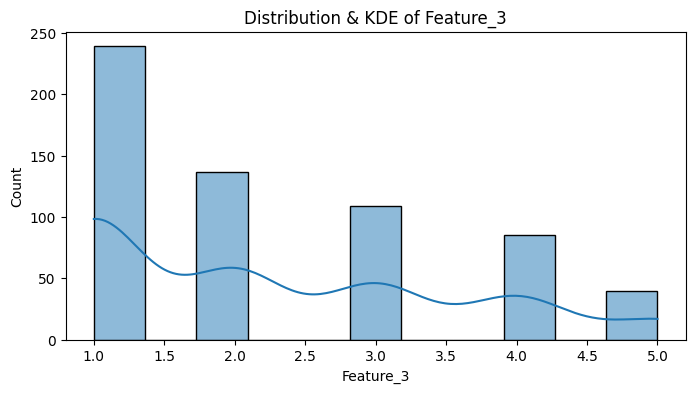

Shapiro-Wilk Test for Feature_3: stat=0.8409, p=0.0000 (p<0.05 means non-normal)

Correlation of anonymized features with other numeric columns:
             school       sex   address      Medu      Fedu  traveltime  \
Feature_1  0.086339 -0.032216  0.033205 -0.111327 -0.138840    0.045970   
Feature_2 -0.133219 -0.201431 -0.060849  0.097210  0.051633   -0.048797   
Feature_3  0.003885  0.328217 -0.007550 -0.009095  0.040817    0.052514   

           failures  schoolsup    famsup      paid  ...      Dalc    health  \
Feature_1  0.312151  -0.177332 -0.103016  0.007482  ...  0.168583 -0.007759   
Feature_2 -0.144468   0.074634  0.139582  0.002277  ... -0.147515 -0.062246   
Feature_3  0.063646  -0.090754 -0.061692  0.044361  ...  0.624373  0.110179   

           absences        G1        G2        G3  Feature_1  Feature_2  \
Feature_1  0.119640 -0.181571 -0.118624 -0.105610   1.000000   0.014528   
Feature_2 -0.133554  0.261477  0.245547  0.249884   0.014528   1.000000   
Feature_3  0

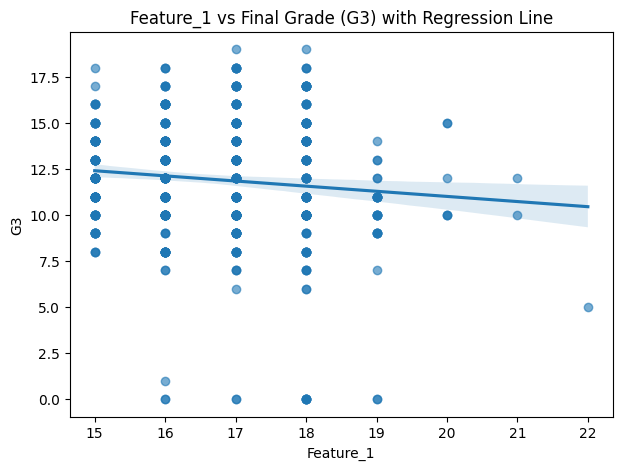

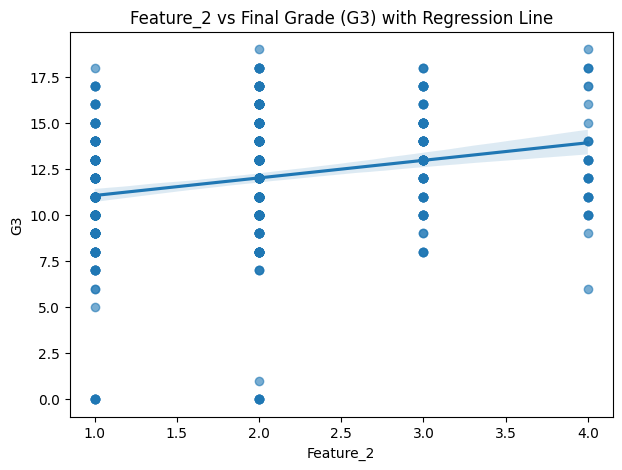

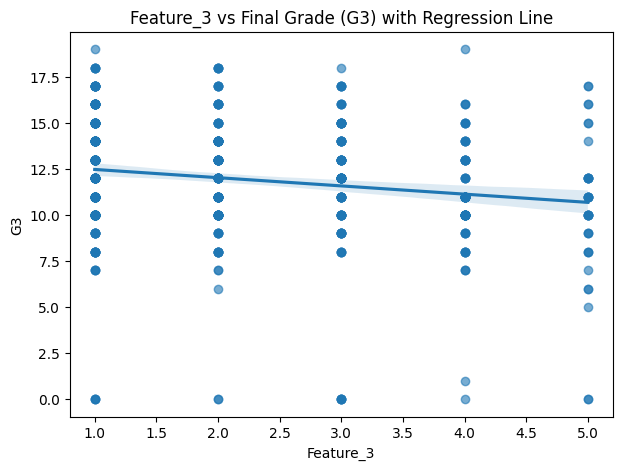

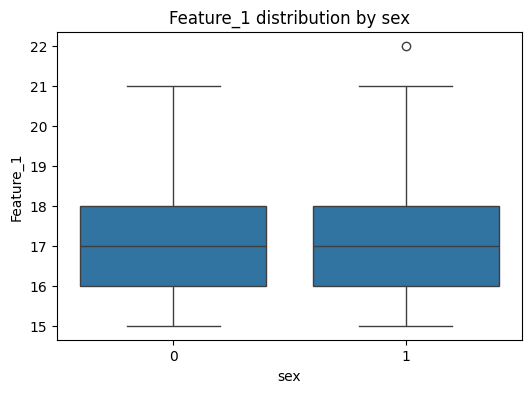

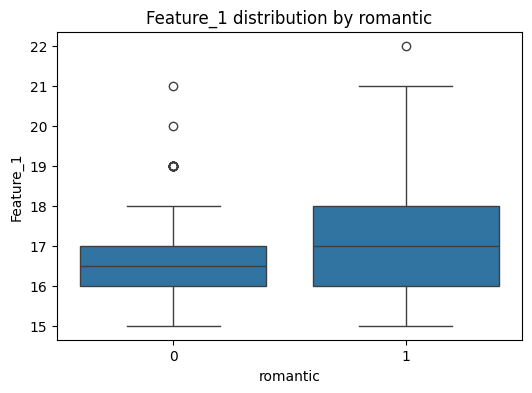

...

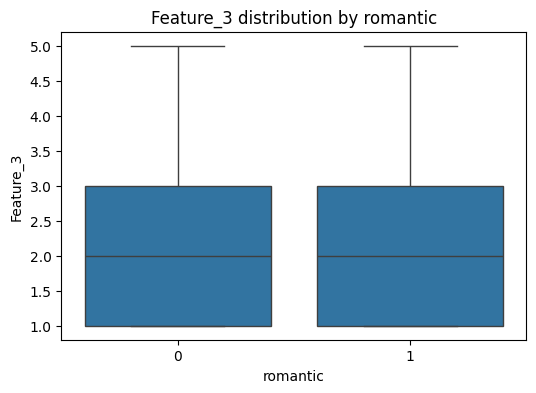

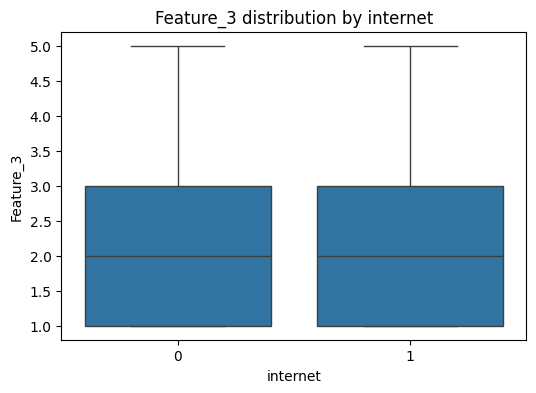

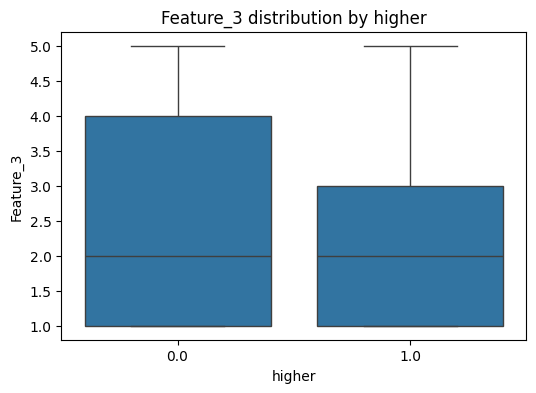

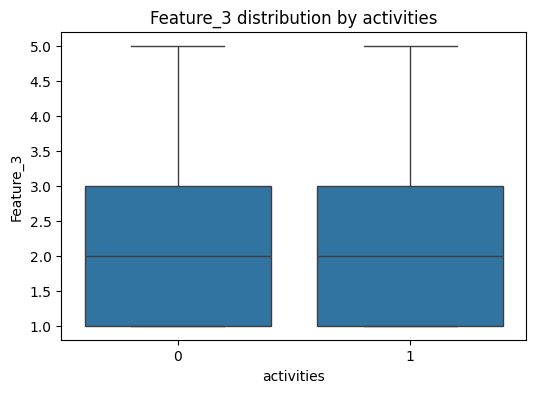

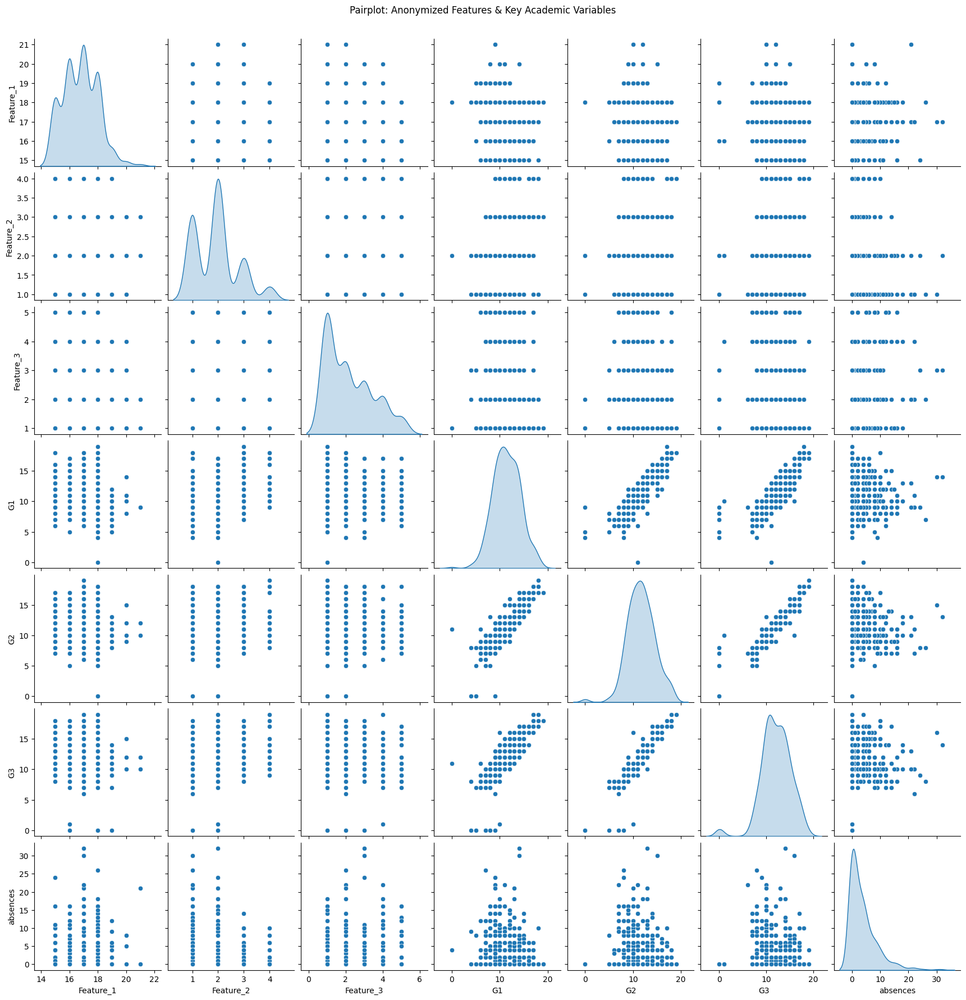

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr, ttest_ind, mannwhitneyu, shapiro, levene

# Load dataset (update path)
df = pd.read_csv("Dataset (2).csv")

# Basic cleaning and encoding (if not done yet)
binary_map = {'yes': 1, 'no': 0}
binary_cols = ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']
for col in binary_cols:
    if col in df.columns:
        df[col] = df[col].map(binary_map)

df['sex'] = df['sex'].map({'F': 0, 'M': 1}) if 'sex' in df.columns else df.get('sex', None)
df['school'] = df['school'].map({'GP': 0, 'MS': 1}) if 'school' in df.columns else df.get('school', None)
df['address'] = df['address'].map({'U': 0, 'R': 1}) if 'address' in df.columns else df.get('address', None)

anon_features = ['Feature_1', 'Feature_2', 'Feature_3']

# 1. Distribution & Normality Tests
for f in anon_features:
    plt.figure(figsize=(8,4))
    sns.histplot(df[f], kde=True)
    plt.title(f'Distribution & KDE of {f}')
    plt.show()

    # Shapiro-Wilk normality test
    stat, p = shapiro(df[f].dropna())
    print(f"Shapiro-Wilk Test for {f}: stat={stat:.4f}, p={p:.4f} (p<0.05 means non-normal)")

# 2. Correlation of anonymized features with numeric variables including grades and absences
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
corr_matrix = df[numeric_cols].corr()

print("\nCorrelation of anonymized features with other numeric columns:")
print(corr_matrix.loc[anon_features])

# 3. Statistical tests by categorical variables (e.g. sex, romantic)
cat_vars = ['sex', 'romantic', 'internet', 'higher', 'activities']
for f in anon_features:
    for cat in cat_vars:
        if cat in df.columns:
            groups = df[[f, cat]].dropna()
            group0 = groups[groups[cat] == 0][f]
            group1 = groups[groups[cat] == 1][f]

            # Check normality and variance homogeneity
            _, p_norm0 = shapiro(group0)
            _, p_norm1 = shapiro(group1)
            _, p_levene = levene(group0, group1)

            # Choose t-test or Mann-Whitney based on normality
            if p_norm0 > 0.05 and p_norm1 > 0.05 and p_levene > 0.05:
                stat, p_val = ttest_ind(group0, group1)
                test_name = 't-test'
            else:
                stat, p_val = mannwhitneyu(group0, group1)
                test_name = 'Mann-Whitney U'

            print(f"{test_name} on {f} by {cat}: stat={stat:.3f}, p={p_val:.4f}")

# 4. Scatterplots of Features vs Final Grade (G3) with regression line
for f in anon_features:
    plt.figure(figsize=(7,5))
    sns.regplot(x=df[f], y=df['G3'], scatter_kws={'alpha':0.6})
    plt.title(f"{f} vs Final Grade (G3) with Regression Line")
    plt.show()

# 5. Boxplots of Features by categorical variables
for f in anon_features:
    for cat in cat_vars:
        if cat in df.columns:
            plt.figure(figsize=(6,4))
            sns.boxplot(x=df[cat], y=df[f])
            plt.title(f"{f} distribution by {cat}")
            plt.show()

# 6. Pairwise correlation and scatter matrix for anonymized features and key numeric vars
sns.pairplot(df[anon_features + ['G1', 'G2', 'G3', 'absences']].dropna(), diag_kind='kde')
plt.suptitle("Pairplot: Anonymized Features & Key Academic Variables", y=1.02)
plt.show()


In [23]:
# Grouped descriptive statistics by categorical variables
categorical_vars = ['sex', 'romantic', 'school', 'internet']

for cat in categorical_vars:
    print(f"\nGrouped statistics by {cat}:")
    display(df.groupby(cat)[['Feature_1', 'Feature_2', 'Feature_3']].describe())



Grouped statistics by sex:


Feature_1                                                    Feature_2  \
        count       mean       std   min   25%   50%   75%   max     count   
sex                                                                          
0       364.0  16.780220  1.176465  15.0  16.0  17.0  18.0  21.0     355.0   
1       247.0  16.700405  1.274882  15.0  16.0  17.0  18.0  22.0     248.0   

               ...           Feature_3                                     \
         mean  ...  75%  max     count      mean       std  min  25%  50%   
sex            ...                                                          
0    2.053521  ...  2.0  4.0     363.0  1.914601  1.049010  1.0  1.0  2.0   
1    1.713710  ...  2.0  4.0     247.0  2.773279  1.424672  1.0  1.0  3.0   

               
     75%  max  
sex            
0    3.0  5.0  
1    4.0  5.0  

[2 rows x 24 columns]


Grouped statistics by romantic:


Feature_1                                                     \
             count       mean       std   min   25%   50%   75%   max   
romantic                                                                
0            392.0  16.584184  1.156790  15.0  16.0  16.5  17.0  21.0   
1            219.0  17.041096  1.268225  15.0  16.0  17.0  18.0  22.0   

         Feature_2            ...           Feature_3                      \
             count      mean  ...  75%  max     count      mean       std   
romantic                      ...                                           
0            378.0  1.880952  ...  2.0  4.0     388.0  2.268041  1.278043   
1            225.0  1.968889  ...  2.0  4.0     222.0  2.252252  1.300668   

                                   
          min  25%  50%  75%  max  
romantic                           
0         1.0  1.0  2.0  3.0  5.0  
1         1.0  1.0  2.0  3.0  5.0  

[2 rows x 24 columns]


Grouped statistics by school:


Feature_1                                                      \
           count       mean       std   min   25%   50%    75%   max   
school                                                                 
0          394.0  16.670051  1.246988  15.0  16.0  17.0  17.75  22.0   
1          217.0  16.889401  1.149367  15.0  16.0  17.0  18.00  20.0   

       Feature_2            ...           Feature_3                           \
           count      mean  ...  75%  max     count      mean       std  min   
school                      ...                                                
0          392.0  1.994898  ...  2.0  4.0     402.0  2.258706  1.305173  1.0   
1          211.0  1.763033  ...  2.0  4.0     208.0  2.269231  1.249006  1.0   

                            
        25%  50%  75%  max  
school                      
0       1.0  2.0  3.0  5.0  
1       1.0  2.0  3.0  5.0  

[2 rows x 24 columns]


Grouped statistics by internet:


Feature_1                                                    \
             count      mean       std   min   25%   50%   75%   max   
internet                                                               
0            142.0  16.71831  1.150801  15.0  16.0  17.0  17.0  20.0   
1            469.0  16.75693  1.237148  15.0  16.0  17.0  18.0  22.0   

         Feature_2            ...           Feature_3                      \
             count      mean  ...  75%  max     count      mean       std   
internet                      ...                                           
0            137.0  1.861314  ...  2.0  4.0     139.0  2.151079  1.301692   
1            466.0  1.929185  ...  2.0  4.0     471.0  2.295117  1.279942   

                                   
          min  25%  50%  75%  max  
internet                           
0         1.0  1.0  2.0  3.0  5.0  
1         1.0  1.0  2.0  3.0  5.0  

[2 rows x 24 columns]

In [24]:
from scipy.stats import ttest_ind, mannwhitneyu

# Example: Test if Feature_1 differs by gender (sex: 0,1)
group1 = df[df['sex'] == 0]['Feature_1']
group2 = df[df['sex'] == 1]['Feature_1']

# Use t-test or Mann-Whitney U test depending on normality
stat, p = ttest_ind(group1, group2, nan_policy='omit')
print(f"Feature_1 by sex t-test p-value: {p:.4f}")

# Repeat for other features and categorical vars, switching tests if data is non-normal


Feature_1 by sex t-test p-value: 0.4267


In [25]:
from scipy.stats import shapiro

for feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    stat, p = shapiro(df[feature].dropna())
    print(f"Shapiro-Wilk test for {feature} p-value: {p:.4f}")


Shapiro-Wilk test for Feature_1 p-value: 0.0000
Shapiro-Wilk test for Feature_2 p-value: 0.0000
Shapiro-Wilk test for Feature_3 p-value: 0.0000


In [26]:
# Pearson correlation
print("Pearson correlation:")
print(df[['Feature_1', 'Feature_2', 'Feature_3', 'G1', 'G2', 'G3', 'absences']].corr(method='pearson'))

# Spearman correlation
print("\nSpearman correlation:")
print(df[['Feature_1', 'Feature_2', 'Feature_3', 'G1', 'G2', 'G3', 'absences']].corr(method='spearman'))


Pearson correlation:
           Feature_1  Feature_2  Feature_3        G1        G2        G3  \
Feature_1   1.000000   0.014528   0.097160 -0.181571 -0.118624 -0.105610   
Feature_2   0.014528   1.000000  -0.199162  0.261477  0.245547  0.249884   
Feature_3   0.097160  -0.199162   1.000000 -0.152487 -0.168348 -0.175726   
G1         -0.181571   0.261477  -0.152487  1.000000  0.863209  0.826387   
G2         -0.118624   0.245547  -0.168348  0.863209  1.000000  0.921437   
G3         -0.105610   0.249884  -0.175726  0.826387  0.921437  1.000000   
absences    0.119640  -0.133554   0.138778 -0.159026 -0.146747 -0.106241   

           absences  
Feature_1  0.119640  
Feature_2 -0.133554  
Feature_3  0.138778  
G1        -0.159026  
G2        -0.146747  
G3        -0.106241  
absences   1.000000  

Spearman correlation:
           Feature_1  Feature_2  Feature_3        G1        G2        G3  \
Feature_1   1.000000   0.038012   0.106413 -0.172894 -0.120509 -0.072944   
Feature_2   0.03801

In [27]:
import statsmodels.api as sm

X = df[['Feature_1', 'Feature_2', 'Feature_3']].fillna(df.mean())
y = df['G3']

X = sm.add_constant(X)  # add intercept
model = sm.OLS(y, X).fit()

print(model.summary())


TypeError: can only concatenate str (not "int") to str

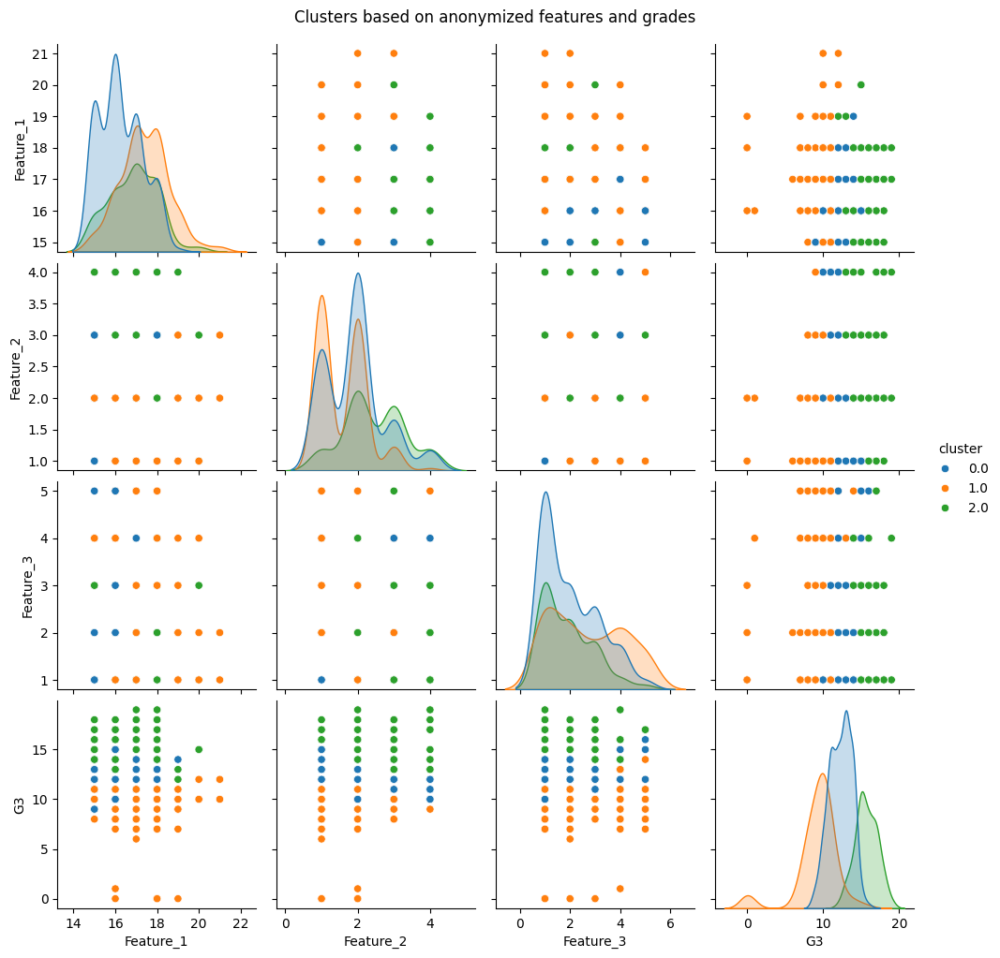

In [28]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

features_for_clustering = df[['Feature_1', 'Feature_2', 'Feature_3', 'G1', 'G2', 'G3', 'absences']].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features_for_clustering)

kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

df['cluster'] = pd.Series(clusters, index=features_for_clustering.index)

import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df.loc[features_for_clustering.index], vars=['Feature_1', 'Feature_2', 'Feature_3', 'G3'], hue='cluster', palette='tab10')
plt.suptitle('Clusters based on anonymized features and grades', y=1.02)
plt.show()


In [29]:
import statsmodels.api as sm
import numpy as np # Import numpy

# Select the features and the target
X_cols = ['Feature_1', 'Feature_2', 'Feature_3']
y = df['G3']

# Select only the features and fill NaN values in these specific columns
# Calculate the mean only on the selected columns
X = df[X_cols].fillna(df[X_cols].mean())

# Ensure X contains only numeric types before adding a constant
# This step is a safeguard, although the fillna above should handle this
X = X.select_dtypes(include=np.number)


X = sm.add_constant(X)  # add intercept

# Drop rows where y is NaN if any (OLS cannot handle NaNs in the target)
# Align X and y after dropping NaNs from y
nan_mask = y.isna()
y = y[~nan_mask]
X = X[~nan_mask]

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                     G3   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     19.10
Date:                Tue, 20 May 2025   Prob (F-statistic):           7.07e-12
Time:                        10:51:17   Log-Likelihood:                -1653.8
No. Observations:                 649   AIC:                             3316.
Df Residuals:                     645   BIC:                             3334.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.2638      1.758      8.681      0.0

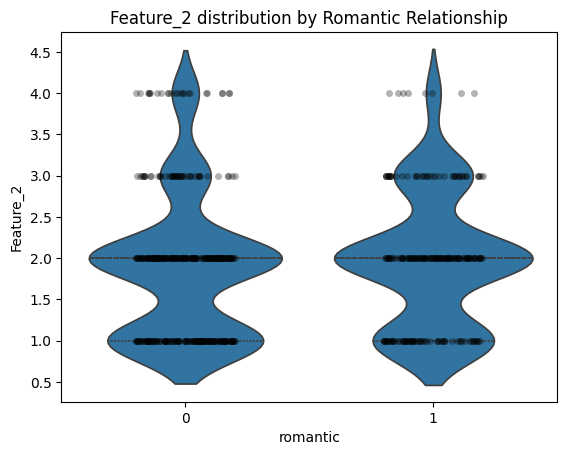

In [30]:
sns.violinplot(x='romantic', y='Feature_2', data=df, inner='quartile')
sns.stripplot(x='romantic', y='Feature_2', data=df, color='k', alpha=0.3, jitter=0.2)
plt.title('Feature_2 distribution by Romantic Relationship')
plt.show()


In [31]:
import pandas as pd
import numpy as np

# Assuming your DataFrame is named df
# 1.a Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

# 1.b Handling missing values
# Option 1: Drop rows with missing values (if few)
df_clean = df.dropna()

# Option 2: Fill missing numeric values with mean
numeric_cols = df.select_dtypes(include=[np.number]).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

# For categorical, fill with mode if any
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])


Missing values per column:
school          0
sex             0
address         0
famsize        50
Pstatus         0
Medu            0
Fedu           73
Mjob            0
Fjob            0
reason          0
guardian        0
traveltime     73
failures        0
schoolsup       0
famsup          0
paid            0
activities      0
nursery         0
higher         76
internet        0
famrel          0
freetime       45
goout           0
Dalc            0
health          0
absences       69
G1              0
G2             35
G3              0
Feature_1      38
Feature_2      46
Feature_3      39
romantic        0
cluster       200
dtype: int64


In [32]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import mutual_info_classif

# 2.a Remove low variance features
selector = VarianceThreshold(threshold=0.01)
numeric_data = df.select_dtypes(include=[np.number])
selector.fit(numeric_data)
features_high_variance = numeric_data.columns[selector.get_support()]

print("High variance numeric features:")
print(features_high_variance)

# 2.b Correlation matrix to remove highly correlated features (keep one from each pair > 0.85)
corr_matrix = df[features_high_variance].corr().abs()

upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.85)]

print(f"Highly correlated features to drop: {to_drop}")

features_selected = features_high_variance.drop(to_drop)
print(f"Selected numeric features after correlation filter: {features_selected}")

# 2.c Mutual information with target variable (e.g., 'romantic' or 'G3')
# Here for classification (romantic status)
mi = mutual_info_classif(df[features_selected], df['romantic'])
mi_series = pd.Series(mi, index=features_selected).sort_values(ascending=False)

print("Mutual Information scores with 'romantic':")
print(mi_series)


High variance numeric features:
Index(['school', 'sex', 'address', 'Medu', 'Fedu', 'traveltime', 'failures',
       'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher',
       'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
       'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3', 'romantic',
       'cluster'],
      dtype='object')
Highly correlated features to drop: ['G3']
Selected numeric features after correlation filter: Index(['school', 'sex', 'address', 'Medu', 'Fedu', 'traveltime', 'failures',
       'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher',
       'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
       'G1', 'G2', 'Feature_1', 'Feature_2', 'Feature_3', 'romantic',
       'cluster'],
      dtype='object')
Mutual Information scores with 'romantic':
romantic      0.658794
sex           0.057624
Medu          0.043135
Feature_1     0.034708
internet      0.032234
Dalc          0.019097
G1  

Summary statistics:
           school         sex     address        Medu        Fedu  traveltime  \
count  649.000000  649.000000  649.000000  649.000000  649.000000  649.000000   
mean     0.348228    0.409861    0.303544    2.514638    2.303819    1.574653   
std      0.476776    0.492187    0.460143    1.134552    1.046623    0.701398   
min      0.000000    0.000000    0.000000    0.000000    0.000000    1.000000   
25%      0.000000    0.000000    0.000000    2.000000    1.000000    1.000000   
50%      0.000000    0.000000    0.000000    2.000000    2.000000    1.574653   
75%      1.000000    1.000000    1.000000    4.000000    3.000000    2.000000   
max      1.000000    1.000000    1.000000    4.000000    4.000000    4.000000   

         failures   schoolsup      famsup        paid  ...        Dalc  \
count  649.000000  649.000000  649.000000  649.000000  ...  649.000000   
mean     0.221880    0.104777    0.613251    0.060092  ...    1.502311   
std      0.593235    0.30650

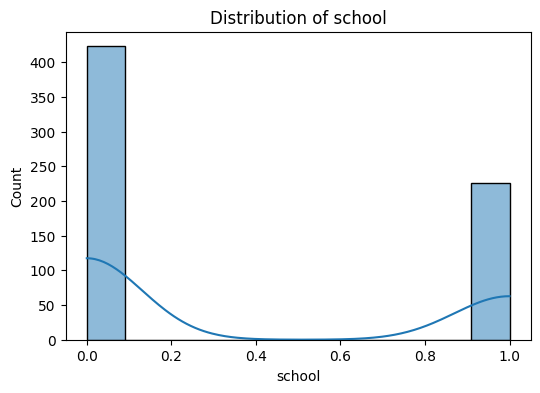

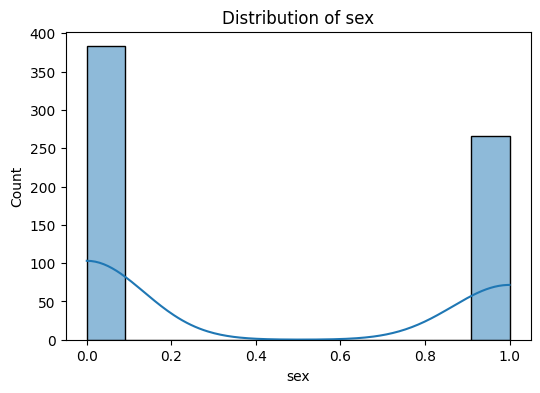

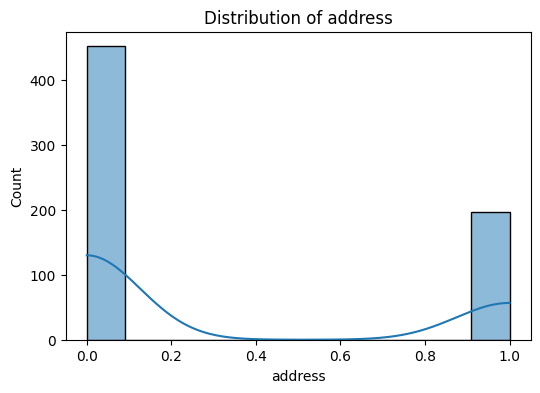

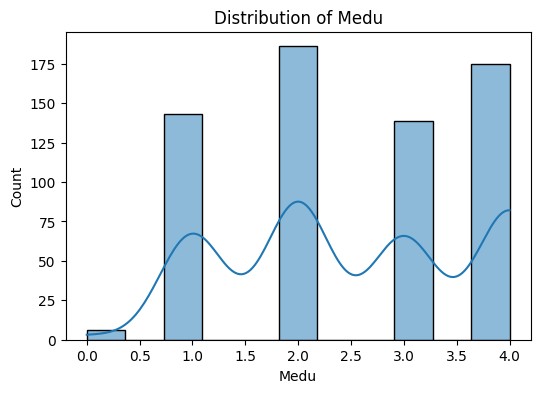

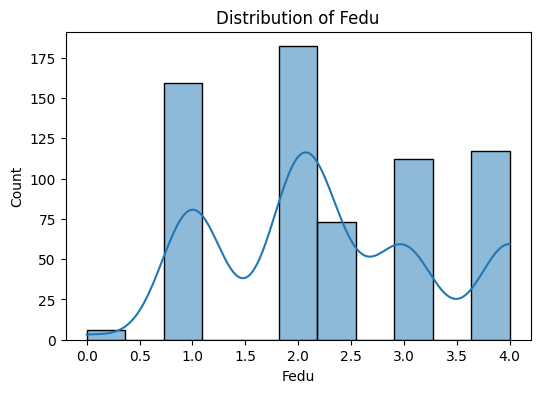

...

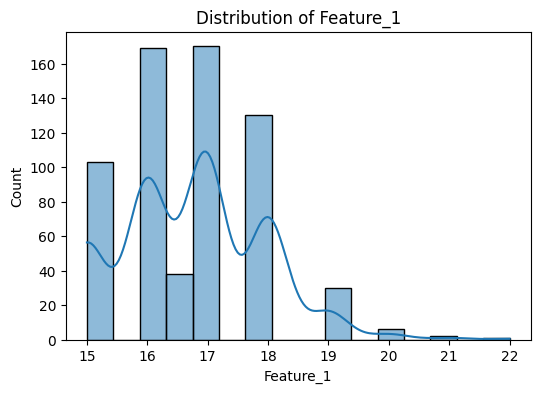

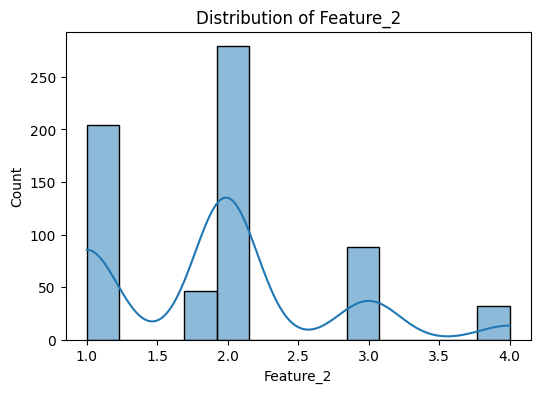

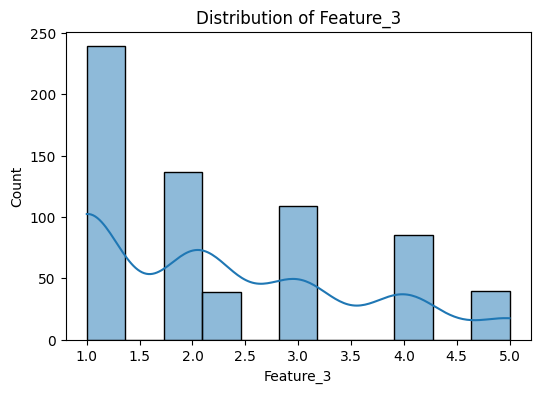

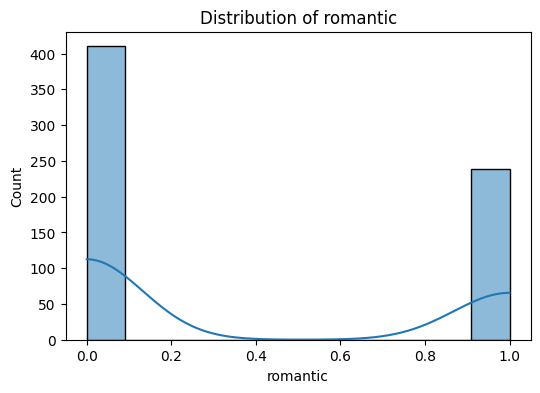

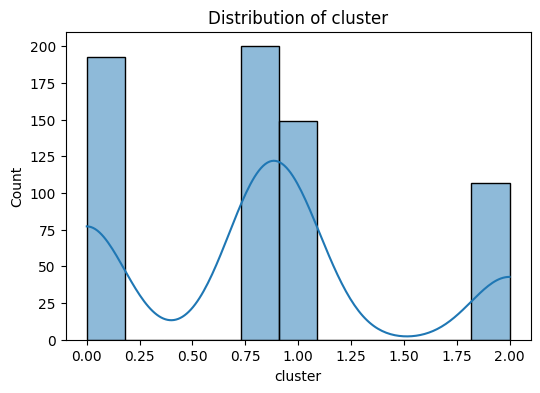

In [33]:
print("Summary statistics:")
print(df[features_selected].describe())

import matplotlib.pyplot as plt
import seaborn as sns

# Distribution plot for numeric features
for feature in features_selected:
    plt.figure(figsize=(6,4))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()


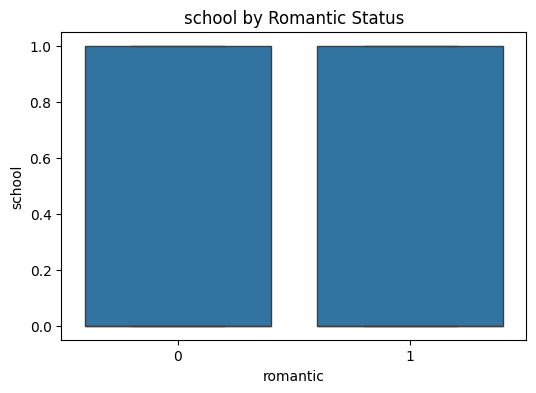

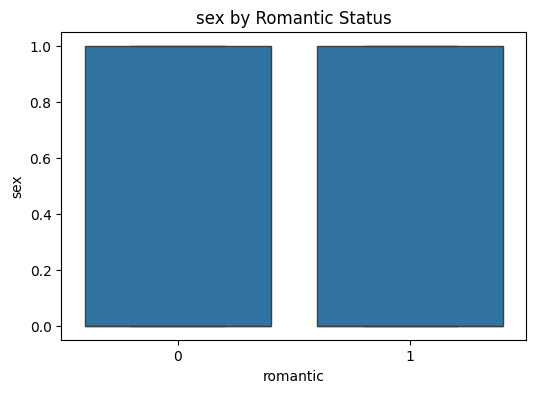

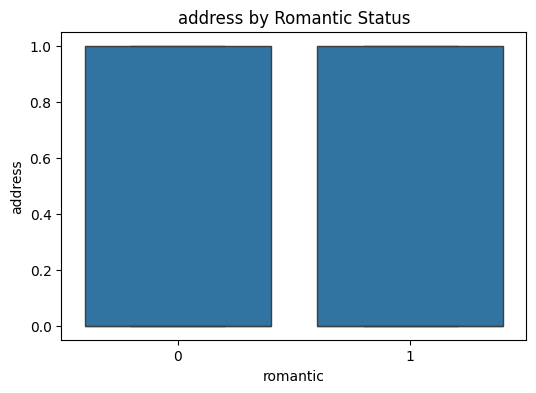

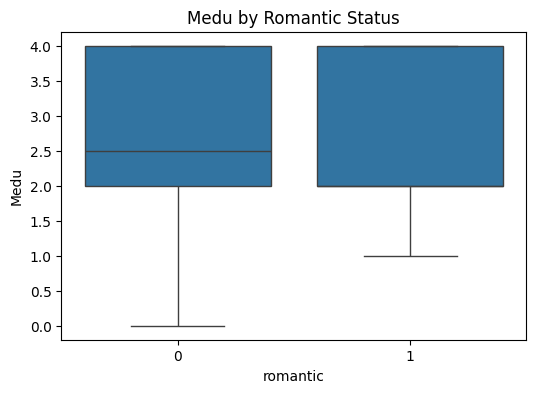

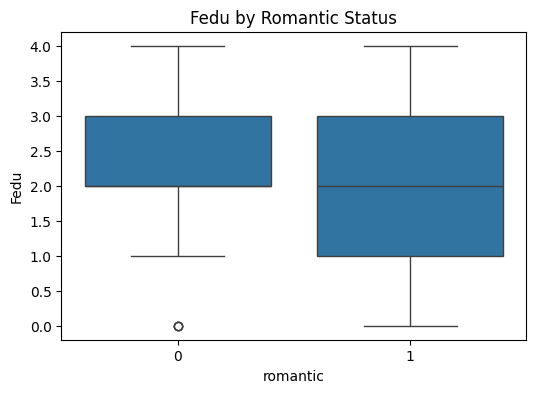

...

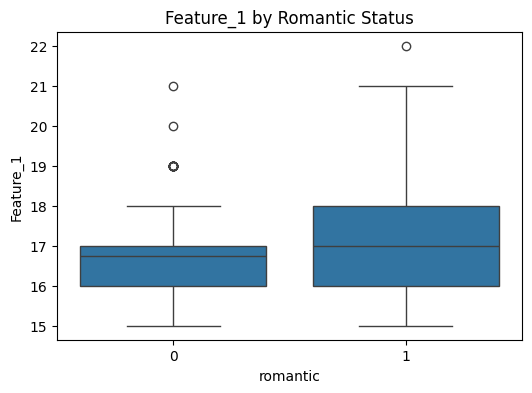

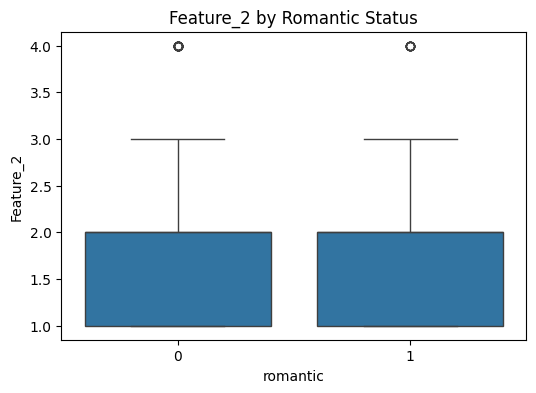

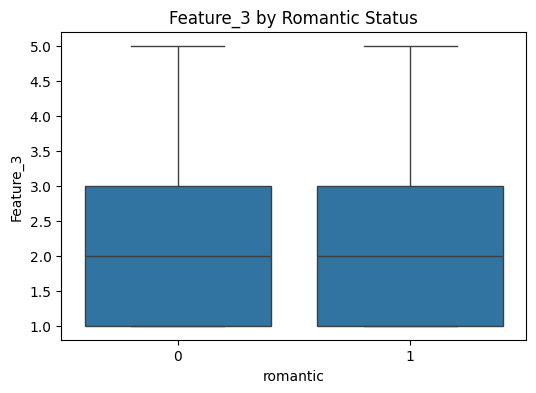

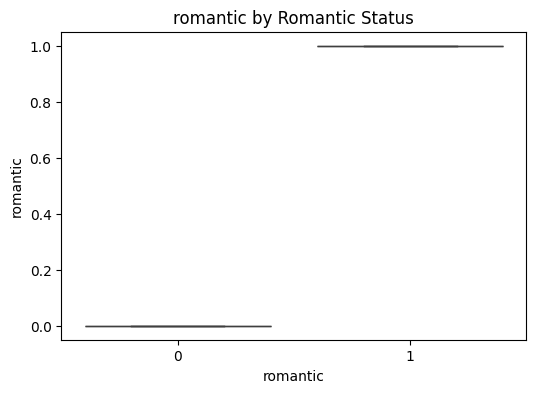

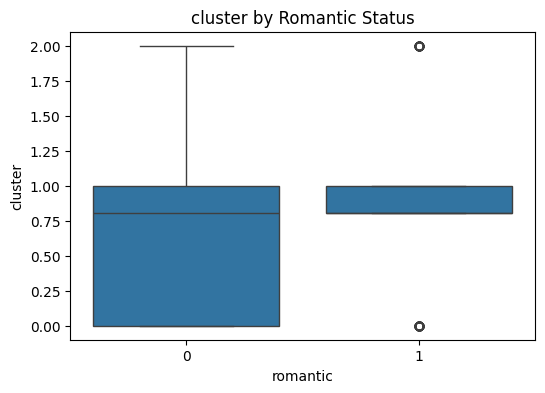

In [34]:
for feature in features_selected:
    plt.figure(figsize=(6,4))
    sns.boxplot(x='romantic', y=feature, data=df)
    plt.title(f'{feature} by Romantic Status')
    plt.show()


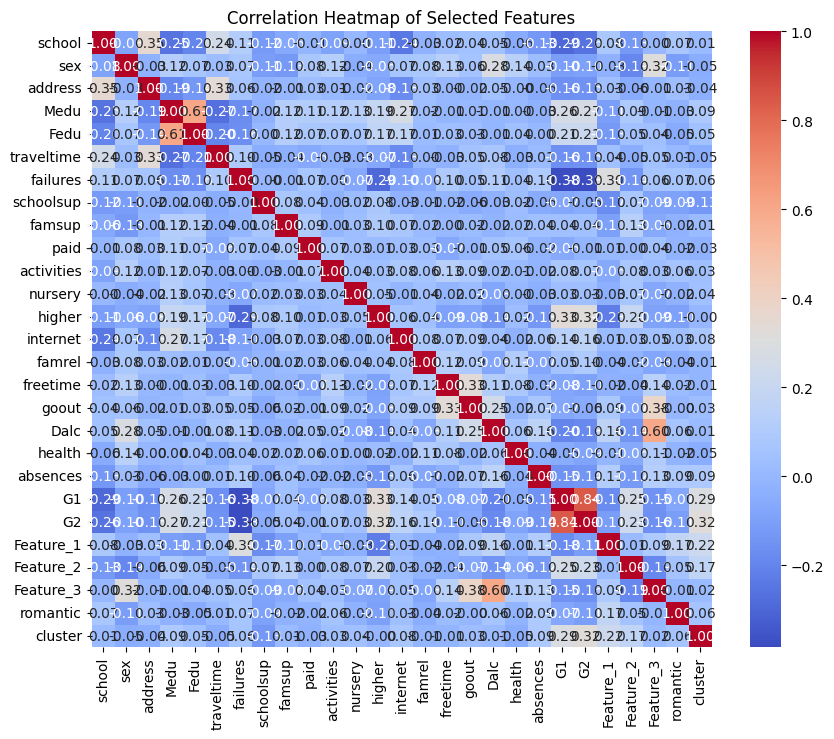

In [35]:
plt.figure(figsize=(10,8))
sns.heatmap(df[features_selected].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Selected Features')
plt.show()


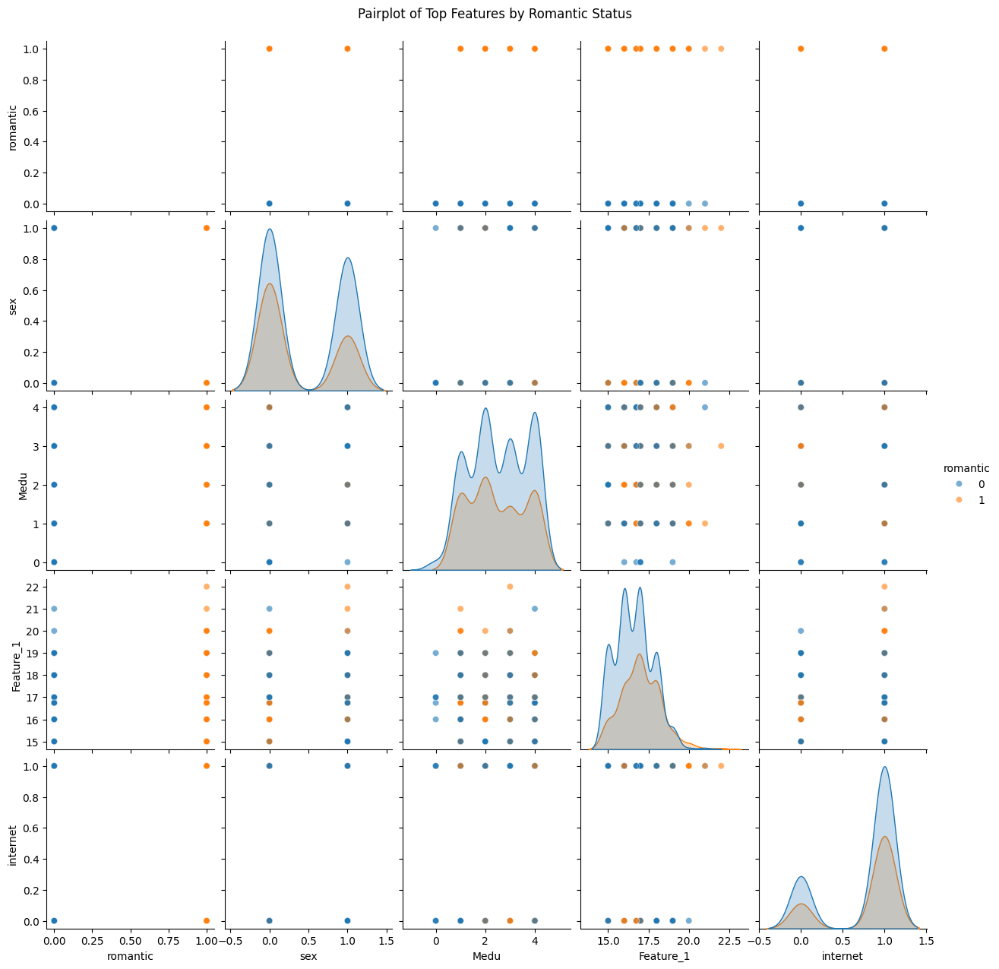

()

In [36]:
top_features = mi_series.index[:5].tolist()  # top 5 features with highest MI

sns.pairplot(df, vars=top_features, hue='romantic', diag_kind='kde', plot_kws={'alpha':0.6})
plt.suptitle('Pairplot of Top Features by Romantic Status', y=1.02)
plt.show()
/

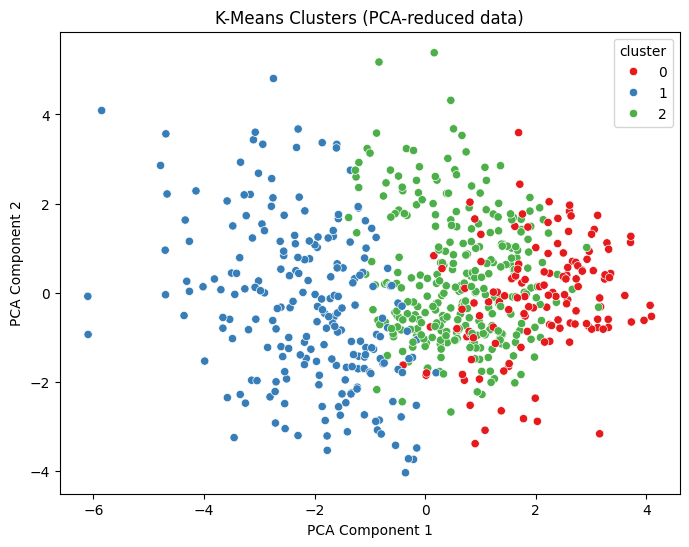

           school       sex   address      Medu      Fedu  traveltime  \
cluster                                                                 
0        0.244444  0.296296  0.200000  2.948148  2.567091    1.388670   
1        0.720183  0.463303  0.536697  1.779817  1.776973    1.966249   
2        0.121622  0.422297  0.179054  2.858108  2.571761    1.371070   

         failures  schoolsup    famsup      paid  ...      Dalc    health  \
cluster                                           ...                       
0        0.014815   0.029630  0.651852  0.037037  ...  1.192593  3.214815   
1        0.582569   0.050459  0.509174  0.059633  ...  1.733945  3.541284   
2        0.050676   0.179054  0.672297  0.070946  ...  1.472973  3.679054   

         absences         G1         G2  Feature_1  Feature_2  Feature_3  \
cluster                                                                    
0        2.516437  14.851852  15.285825  16.853598   2.431927   1.824529   
1        3.927262   

In [37]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Standardize features before clustering
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features_selected])

# Choose number of clusters (e.g., 3) using elbow method or domain knowledge
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to original dataframe
df['cluster'] = clusters

# PCA for 2D visualization
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
sns.scatterplot(x=components[:,0], y=components[:,1], hue=df['cluster'], palette='Set1')
plt.title('K-Means Clusters (PCA-reduced data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

# Explore clusters summary
print(df.groupby('cluster')[features_selected].mean())


In [38]:
from scipy.stats import ttest_ind

group1 = df[df['romantic'] == 1]
group0 = df[df['romantic'] == 0]

print("T-test results between romantic and non-romantic groups:")

for feature in features_selected:
    stat, p = ttest_ind(group1[feature], group0[feature], nan_policy='omit')
    print(f"{feature}: t-stat = {stat:.3f}, p-value = {p:.4f}")


T-test results between romantic and non-romantic groups:
school: t-stat = 1.842, p-value = 0.0659
sex: t-stat = -2.819, p-value = 0.0050
address: t-stat = 0.787, p-value = 0.4314
Medu: t-stat = -0.789, p-value = 0.4306
Fedu: t-stat = -1.395, p-value = 0.1635
traveltime: t-stat = 0.183, p-value = 0.8550
failures: t-stat = 1.782, p-value = 0.0752
schoolsup: t-stat = -2.410, p-value = 0.0162
famsup: t-stat = -0.595, p-value = 0.5518
paid: t-stat = -0.466, p-value = 0.6415
activities: t-stat = 1.465, p-value = 0.1433
nursery: t-stat = -0.585, p-value = 0.5589
higher: t-stat = -2.541, p-value = 0.0113
internet: t-stat = 0.887, p-value = 0.3757
famrel: t-stat = -1.144, p-value = 0.2532
freetime: t-stat = 0.413, p-value = 0.6796
goout: t-stat = -0.013, p-value = 0.9895
Dalc: t-stat = 1.581, p-value = 0.1143
health: t-stat = -0.459, p-value = 0.6467
absences: t-stat = 2.272, p-value = 0.0234
G1: t-stat = -1.912, p-value = 0.0563
G2: t-stat = -2.695, p-value = 0.0072
Feature_1: t-stat = 4.490, 

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score

# Prepare data
X = df[features_selected]
y = df['romantic']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train model
logreg = LogisticRegression()
logreg.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = logreg.predict(X_test_scaled)
y_prob = logreg.predict_proba(X_test_scaled)[:,1]

print(classification_report(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))

# Feature importance (coefficients)
coef_df = pd.DataFrame({
    'Feature': features_selected,
    'Coefficient': logreg.coef_[0]
}).sort_values(by='Coefficient', key=abs, ascending=False)

print(coef_df)


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        81
           1       1.00      1.00      1.00        49

    accuracy                           1.00       130
   macro avg       1.00      1.00      1.00       130
weighted avg       1.00      1.00      1.00       130

ROC AUC: 1.0
       Feature  Coefficient
25    romantic     4.508083
1          sex    -0.132505
22   Feature_1     0.127893
21          G2    -0.111503
19    absences     0.079118
17        Dalc     0.073254
10  activities     0.069086
23   Feature_2     0.057303
7    schoolsup    -0.054135
0       school     0.045848
9         paid    -0.045050
13    internet     0.044294
12      higher    -0.043243
5   traveltime    -0.033908
14      famrel    -0.030657
20          G1     0.030484
11     nursery    -0.027975
16       goout    -0.026551
24   Feature_3    -0.018447
18      health     0.014844
15    freetime     0.012902
6     failures     0.010904
26     cluster  

In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np # Import numpy for sqrt

# Suppose target is 'G3' (final grade)
X = df[features_selected]
y = df['G3']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

linreg = LinearRegression()
linreg.fit(X_train_scaled, y_train)

y_pred = linreg.predict(X_test_scaled)

# Calculate RMSE by taking the square root of the Mean Squared Error
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.3f}")

print(f"R^2 Score: {r2_score(y_test, y_pred):.3f}")

coef_df = pd.DataFrame({
    'Feature': features_selected,
    'Coefficient': linreg.coef_
}).sort_values(by='Coefficient', key=abs, ascending=False)

print(coef_df)

RMSE: 1.300
R^2 Score: 0.827
       Feature  Coefficient
21          G2     2.183503
20          G1     0.732252
0       school    -0.156042
6     failures    -0.126657
3         Medu    -0.121078
17        Dalc    -0.113109
4         Fedu     0.095173
8       famsup     0.088509
2      address    -0.081290
22   Feature_1     0.079175
14      famrel    -0.078387
19    absences     0.075792
5   traveltime     0.074790
9         paid    -0.072274
15    freetime    -0.069125
7    schoolsup    -0.062179
18      health    -0.056403
16       goout    -0.055850
13    internet     0.051911
23   Feature_2     0.046735
24   Feature_3     0.042664
10  activities    -0.030752
25    romantic     0.028390
1          sex    -0.018686
11     nursery    -0.012225
26     cluster     0.009351
12      higher     0.007987


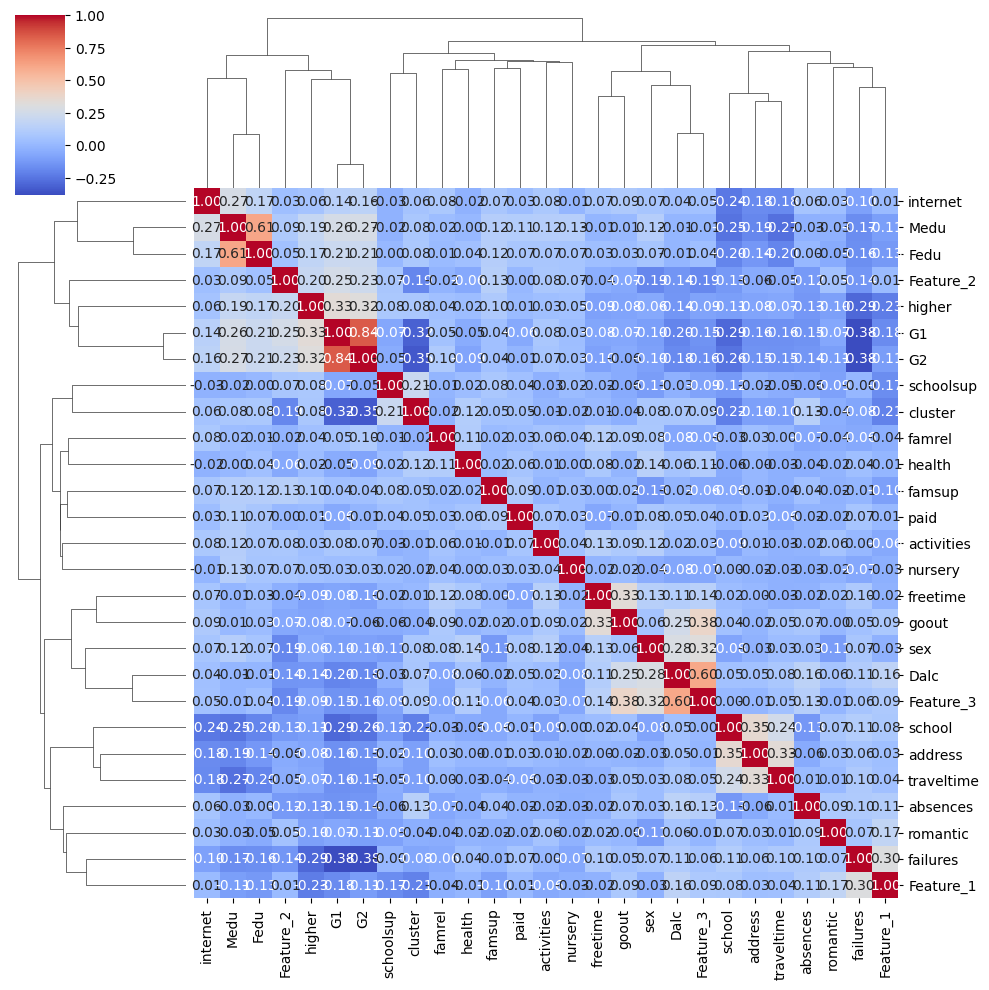

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster import hierarchy

corr = df[features_selected].corr()

# Compute linkage for clustering
linkage = hierarchy.linkage(corr, method='average')

# Create cluster map
sns.clustermap(corr, row_linkage=linkage, col_linkage=linkage,
               cmap='coolwarm', annot=True, fmt=".2f")
plt.show()


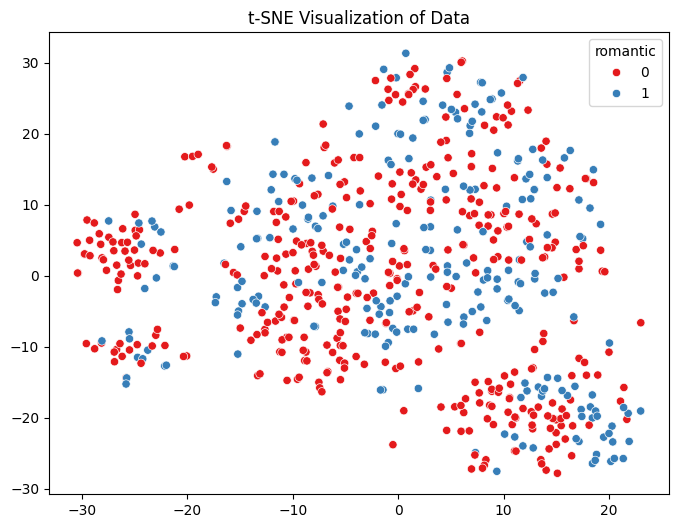

In [45]:
from sklearn.manifold import TSNE
import seaborn as sns

X_scaled = StandardScaler().fit_transform(df[features_selected])
tsne = TSNE(n_components=2, random_state=42)
X_embedded = tsne.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=df['romantic'], palette='Set1')
plt.title('t-SNE Visualization of Data')
plt.show()


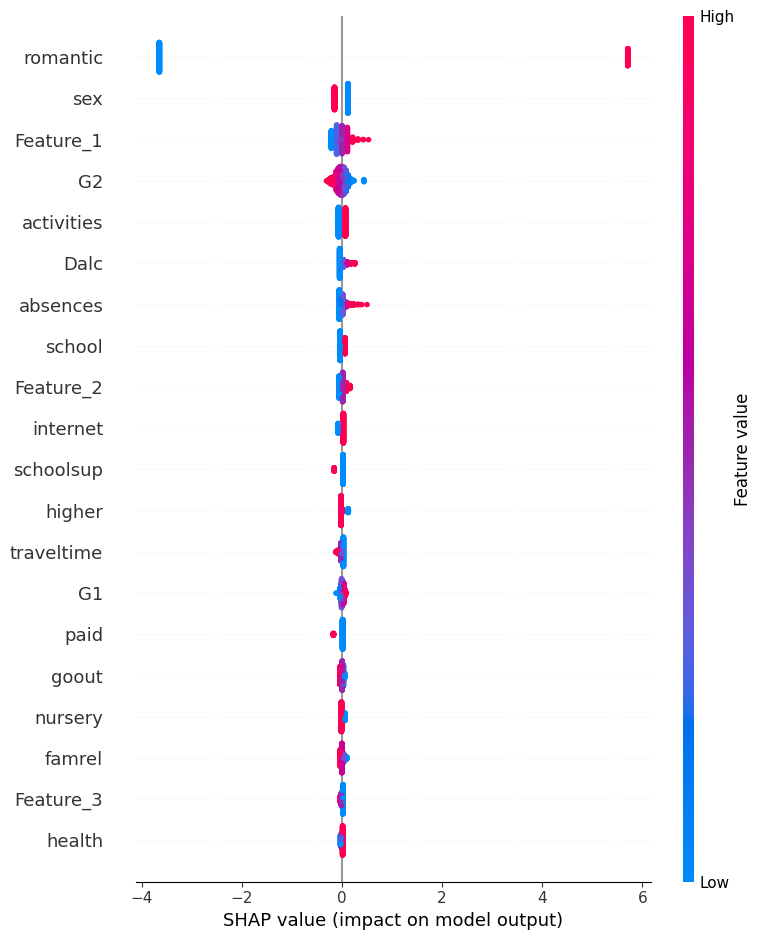

In [46]:
import shap

# Assume `model` is a trained classifier and X_train_scaled is your scaled feature matrix
explainer = shap.Explainer(logreg, X_train_scaled)
shap_values = explainer(X_train_scaled)

shap.summary_plot(shap_values, features=X_train, feature_names=features_selected)


<ipython-input-47-38f809db3602>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='romantic', y='G3', data=df, inner=None, palette='Pastel1')


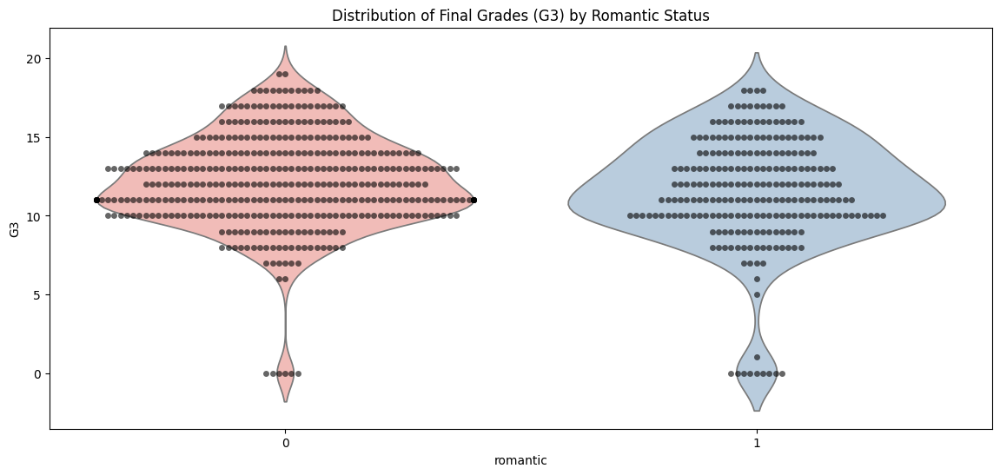

In [47]:
plt.figure(figsize=(14,6))
sns.violinplot(x='romantic', y='G3', data=df, inner=None, palette='Pastel1')
sns.swarmplot(x='romantic', y='G3', data=df, color='k', alpha=0.6)
plt.title('Distribution of Final Grades (G3) by Romantic Status')
plt.show()


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Basic stats
print(df[['Feature_1', 'Feature_2', 'Feature_3']].describe())

# 2. Correlation matrix with other known features
corr = df.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# 3. Distribution plots
for feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    plt.figure()
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# 4. Scatter plots with candidate known features
known_features = ['Age', 'Height', 'Weight', 'Study_Hours', 'Attendance']  # replace with actual known features
for feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    for known in known_features:
        plt.figure()
        sns.scatterplot(x=df[known], y=df[feature])
        plt.title(f'{feature} vs {known}')
        plt.show()


        Feature_1   Feature_2   Feature_3
count  649.000000  649.000000  649.000000
mean    16.747954    1.913765    2.262295
std      1.180595    0.800767    1.246001
min     15.000000    1.000000    1.000000
25%     16.000000    1.000000    1.000000
50%     17.000000    2.000000    2.000000
75%     18.000000    2.000000    3.000000
max     22.000000    4.000000    5.000000


ValueError: could not convert string to float: 'mother'

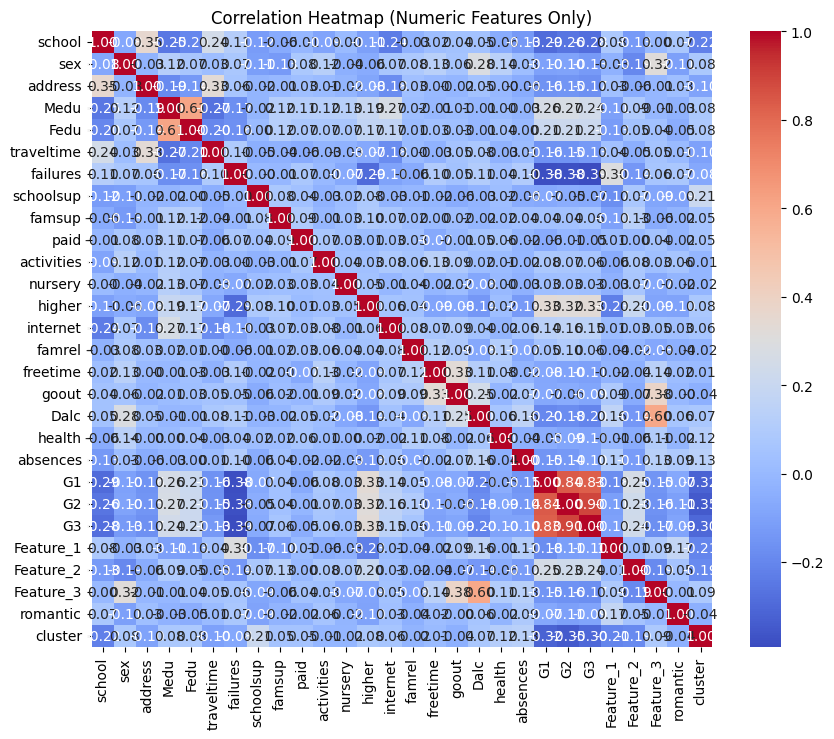

In [51]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Now compute correlation matrix
corr = numeric_df.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (Numeric Features Only)')
plt.show()


In [57]:
print(df[['Feature_1', 'Feature_2', 'Feature_3']].describe())
print(df.describe())  # To get overview of other variables
print(df.columns)


        Feature_1   Feature_2   Feature_3
count  649.000000  649.000000  649.000000
mean    16.747954    1.913765    2.262295
std      1.180595    0.800767    1.246001
min     15.000000    1.000000    1.000000
25%     16.000000    1.000000    1.000000
50%     17.000000    2.000000    2.000000
75%     18.000000    2.000000    3.000000
max     22.000000    4.000000    5.000000
           school         sex     address        Medu        Fedu  traveltime  \
count  649.000000  649.000000  649.000000  649.000000  649.000000  649.000000   
mean     0.348228    0.409861    0.303544    2.514638    2.303819    1.574653   
std      0.476776    0.492187    0.460143    1.134552    1.046623    0.701398   
min      0.000000    0.000000    0.000000    0.000000    0.000000    1.000000   
25%      0.000000    0.000000    0.000000    2.000000    1.000000    1.000000   
50%      0.000000    0.000000    0.000000    2.000000    2.000000    1.574653   
75%      1.000000    1.000000    1.000000    4.000000  

In [55]:
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print(numeric_cols)


['school', 'sex', 'address', 'Medu', 'Fedu', 'traveltime', 'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences', 'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3', 'romantic', 'cluster']


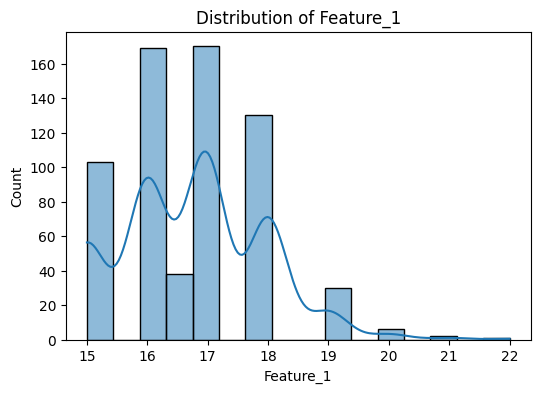

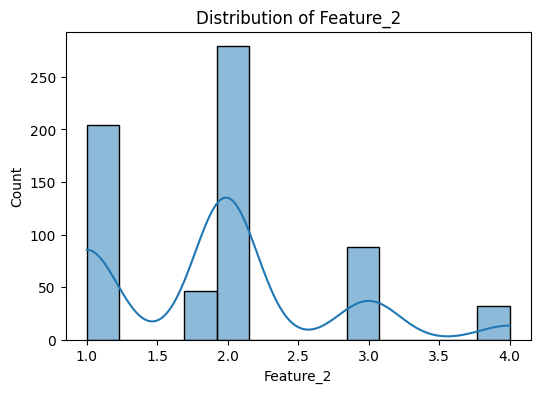

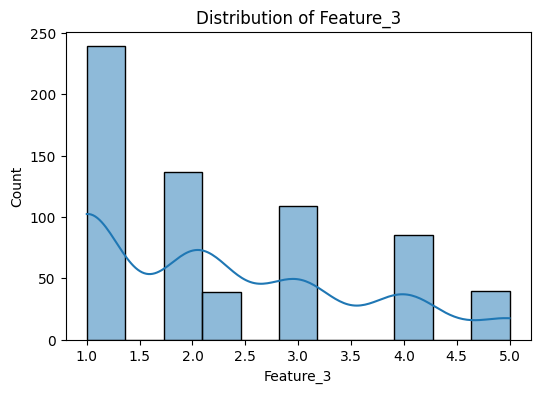

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

for feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    plt.figure(figsize=(6,4))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()


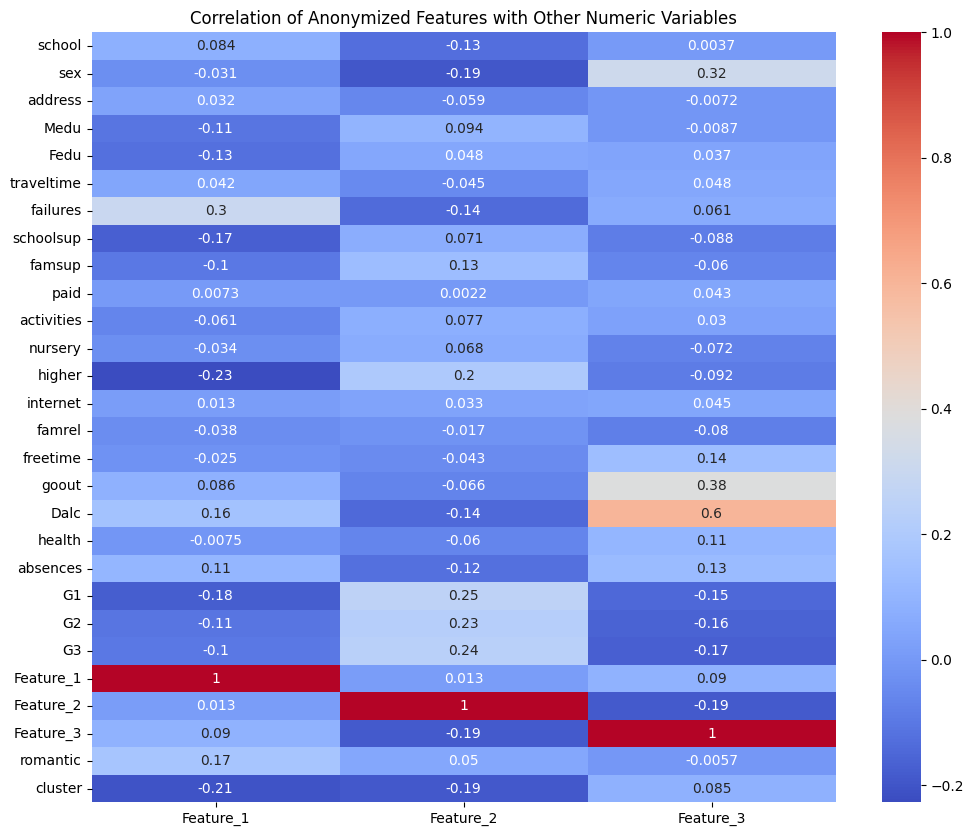

In [60]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Then calculate correlation matrix
corr = numeric_df.corr()

# Plot heatmap of correlation only for the anonymized features
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,10))
sns.heatmap(corr[['Feature_1', 'Feature_2', 'Feature_3']], annot=True, cmap='coolwarm')
plt.title('Correlation of Anonymized Features with Other Numeric Variables')
plt.show()


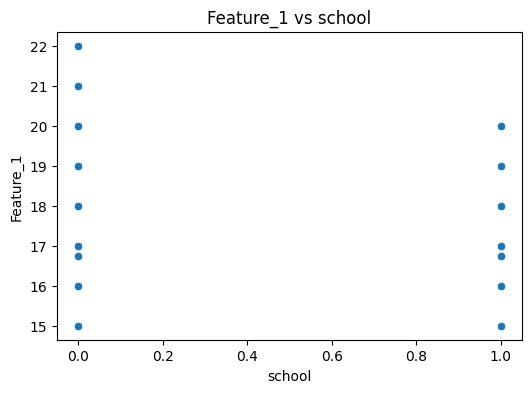

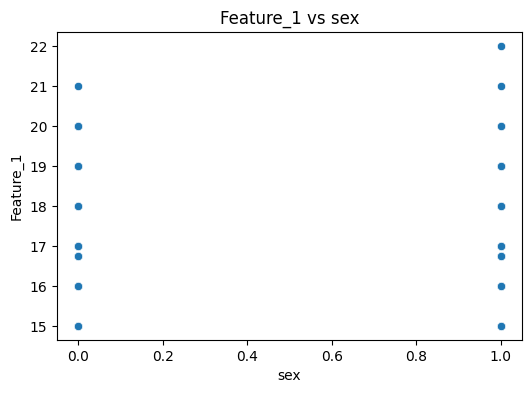

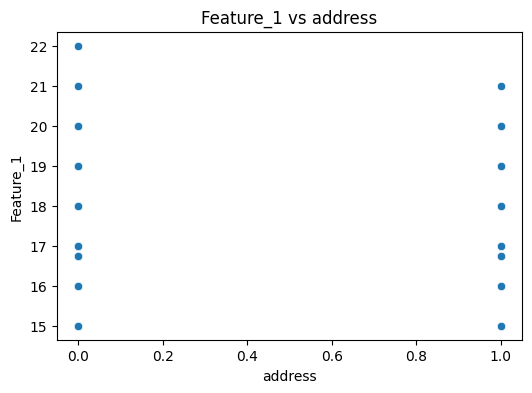

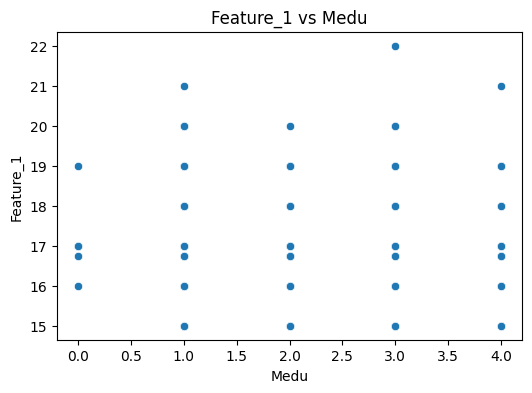

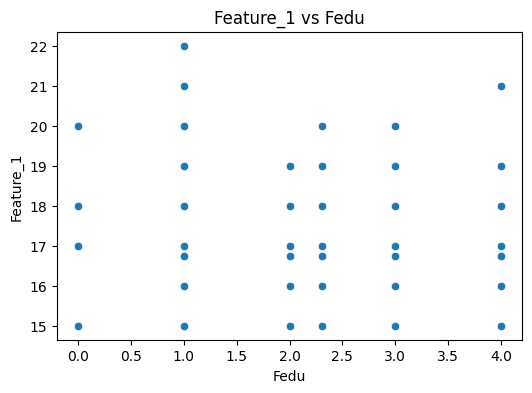

...

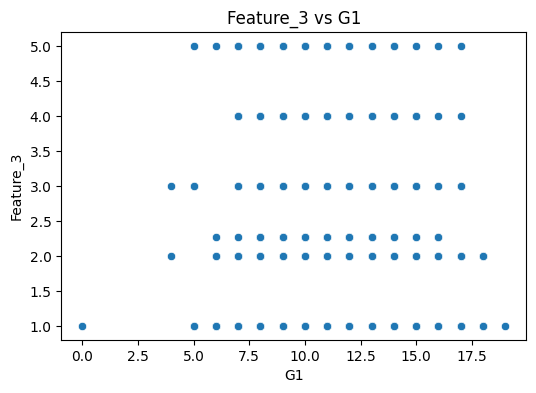

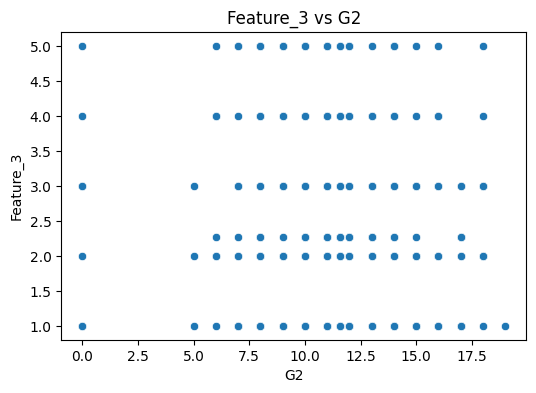

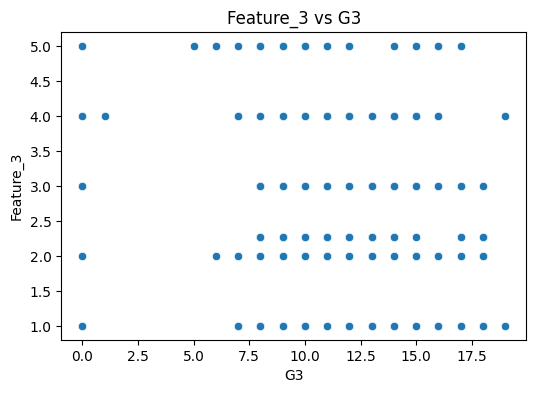

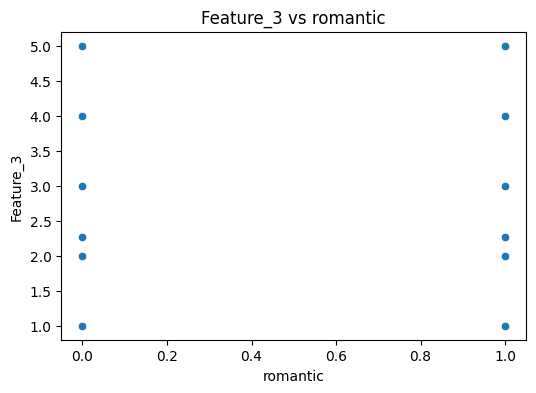

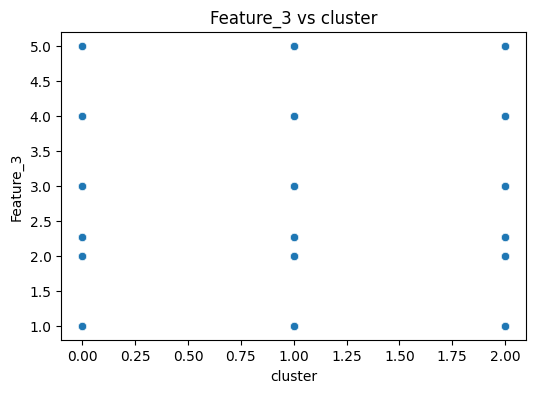

In [61]:
for anon_feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    for col in df.select_dtypes(include='number').columns:
        if col not in ['Feature_1', 'Feature_2', 'Feature_3']:
            plt.figure(figsize=(6,4))
            sns.scatterplot(data=df, x=col, y=anon_feature)
            plt.title(f'{anon_feature} vs {col}')
            plt.show()


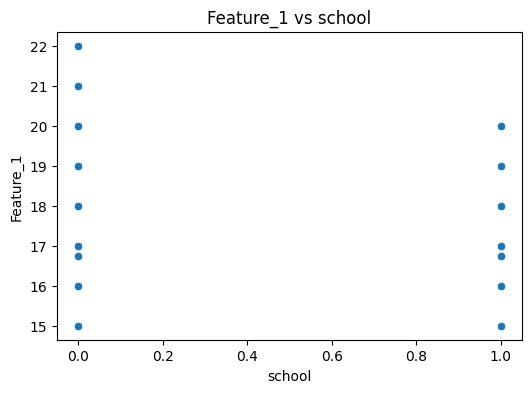

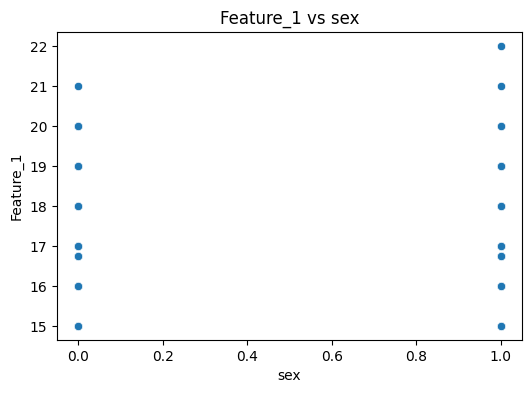

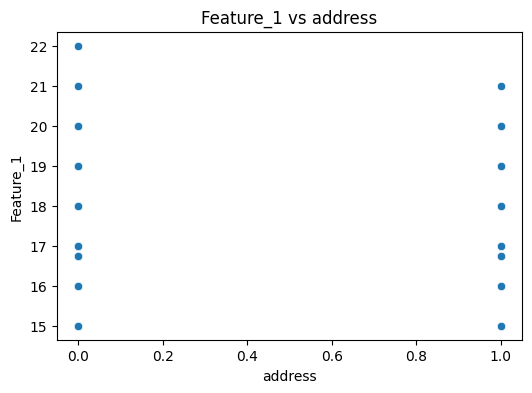

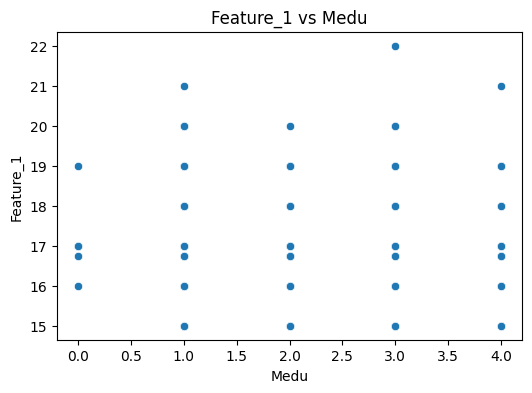

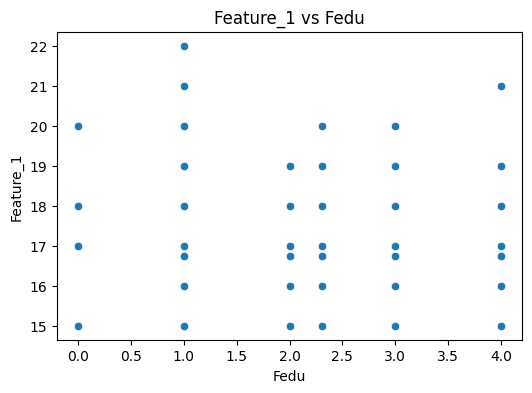

...

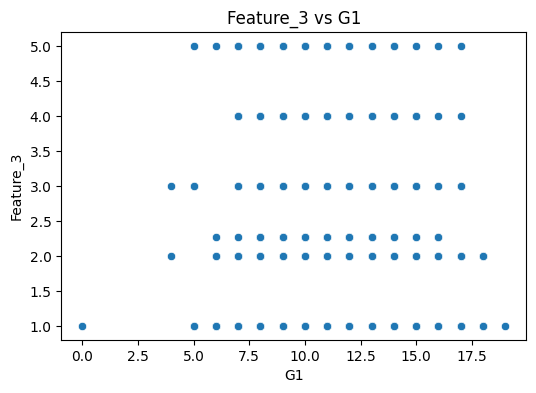

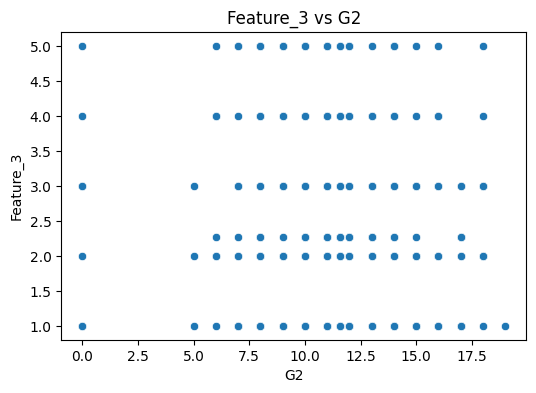

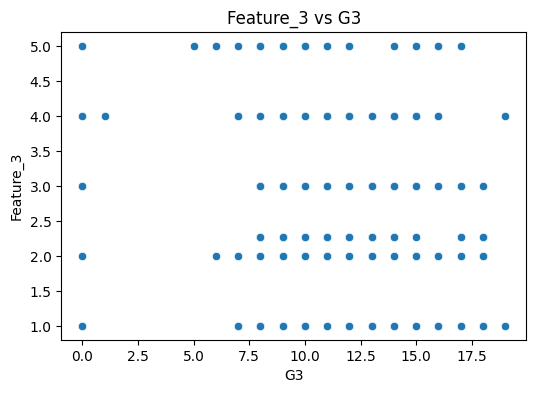

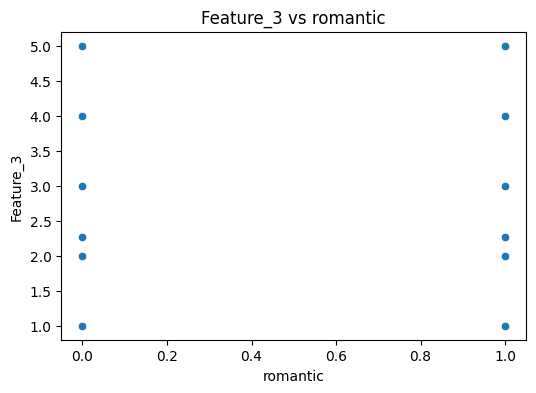

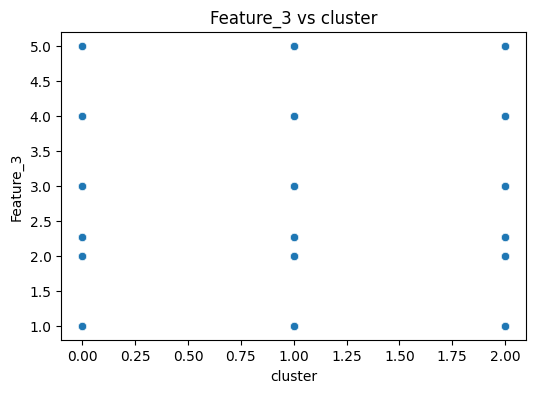

In [62]:
for anon_feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    for col in df.select_dtypes(include='number').columns:
        if col not in ['Feature_1', 'Feature_2', 'Feature_3']:
            plt.figure(figsize=(6,4))
            sns.scatterplot(data=df, x=col, y=anon_feature)
            plt.title(f'{anon_feature} vs {col}')
            plt.show()


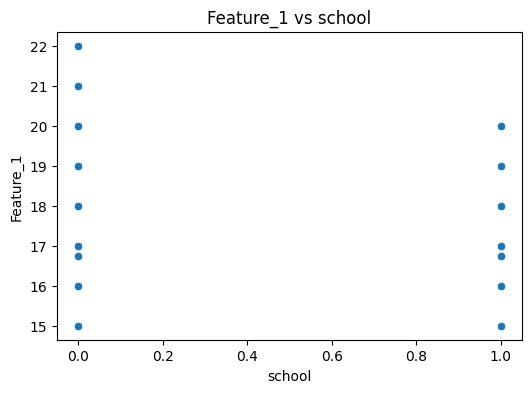

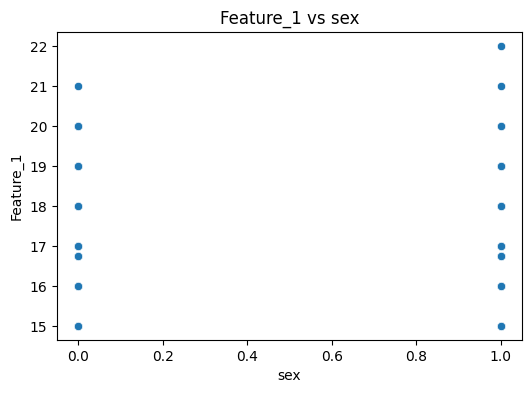

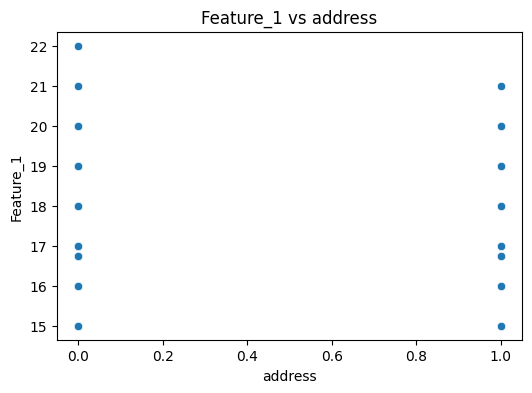

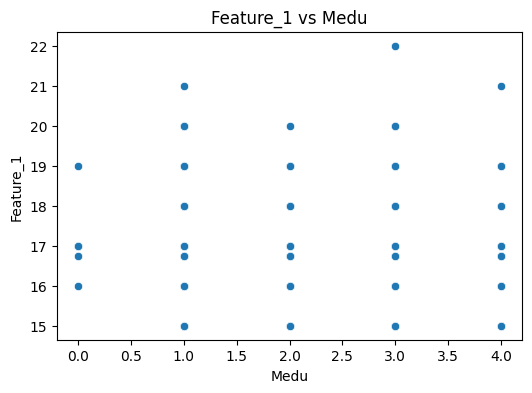

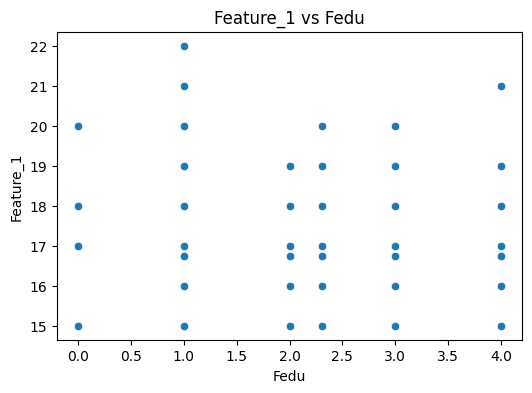

...

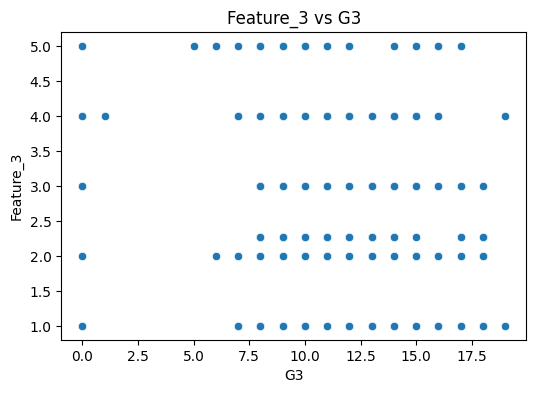

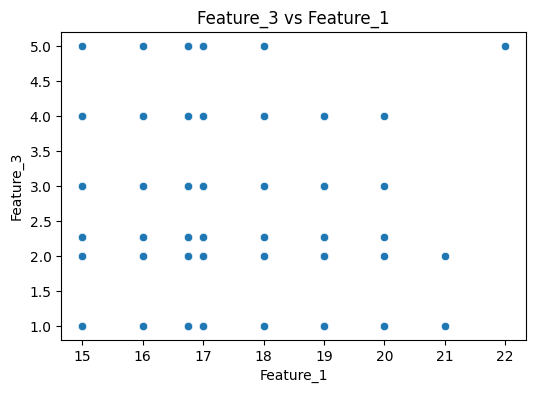

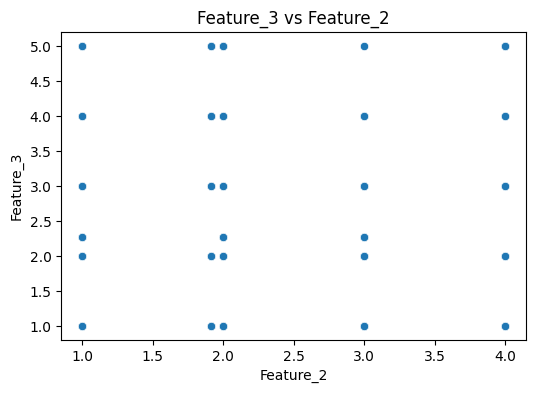

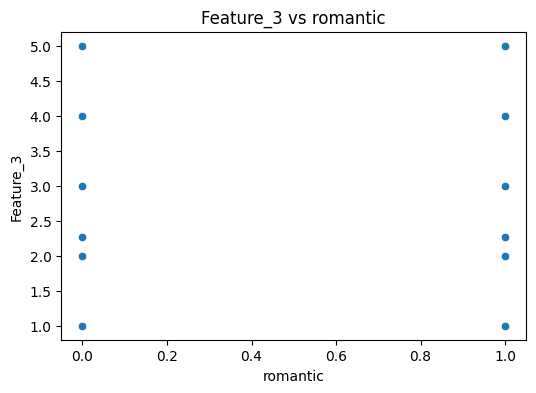

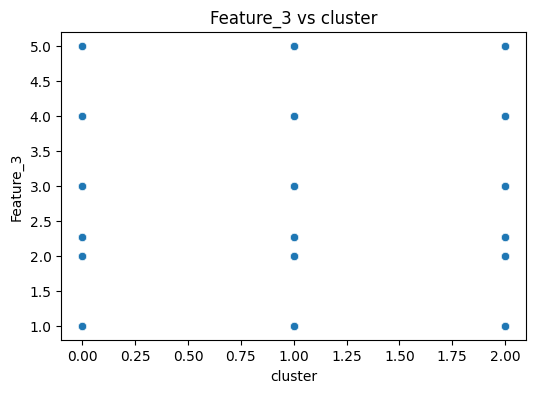

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

for feature in ['Feature_1', 'Feature_2', 'Feature_3']:
    if feature in numeric_cols:
        for other_feature in numeric_cols:
            if other_feature != feature:
                plt.figure(figsize=(6,4))
                sns.scatterplot(x=df[other_feature], y=df[feature])
                plt.title(f'{feature} vs {other_feature}')
                plt.show()


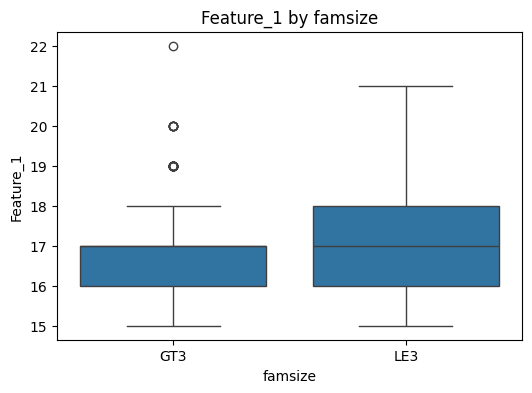

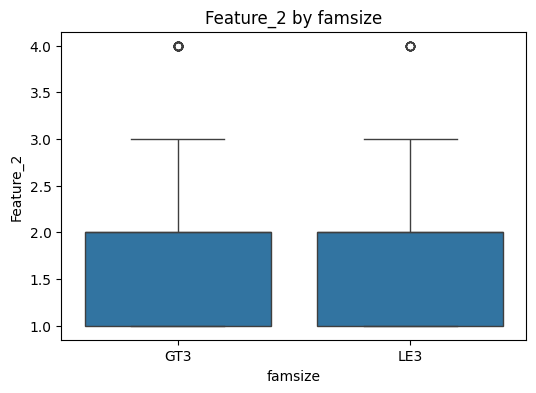

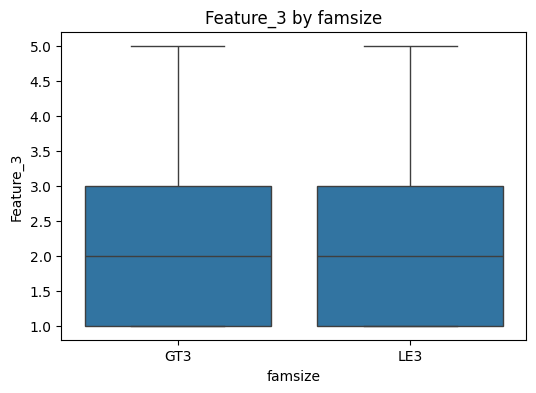

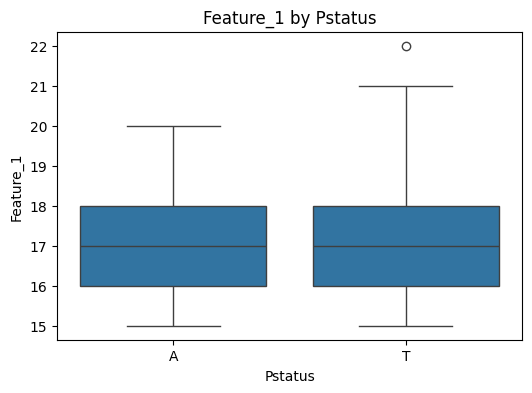

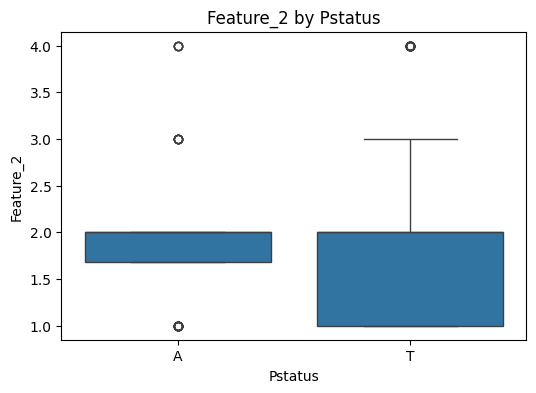

...

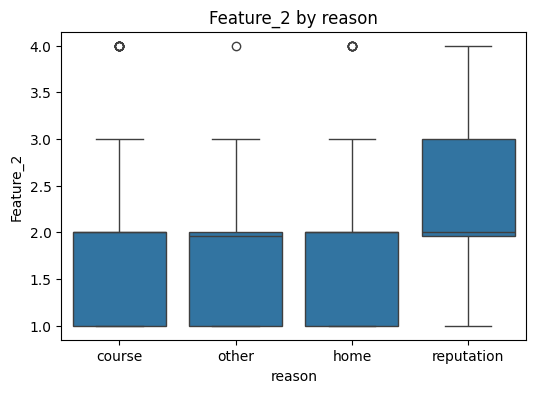

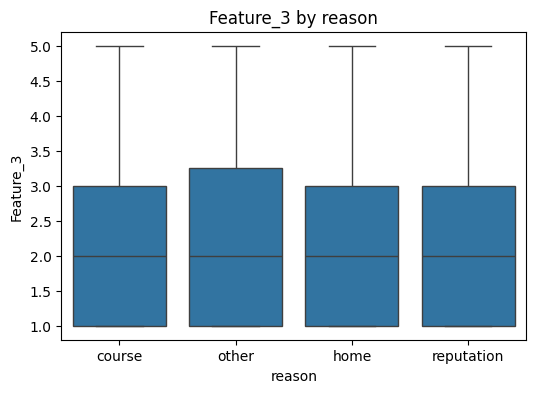

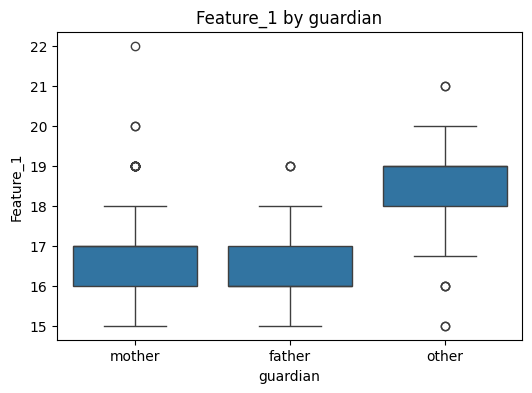

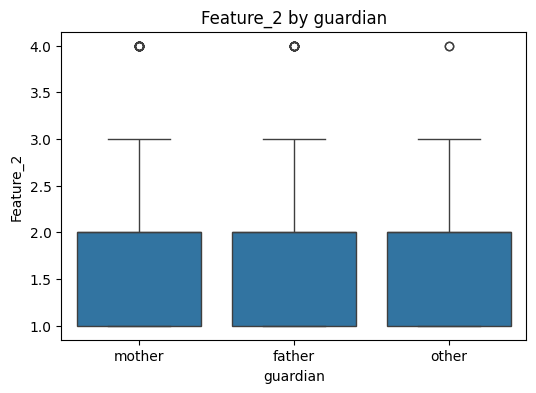

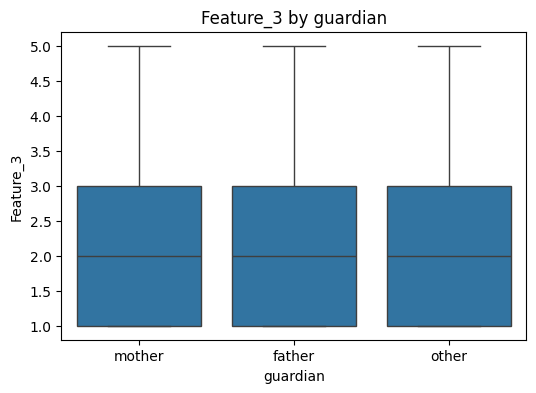

In [64]:
categorical_cols = df.select_dtypes(include='object').columns.tolist()

for cat_col in categorical_cols:
    for anon_feature in ['Feature_1', 'Feature_2', 'Feature_3']:
        plt.figure(figsize=(6,4))
        sns.boxplot(x=df[cat_col], y=df[anon_feature])
        plt.title(f'{anon_feature} by {cat_col}')
        plt.show()


In [63]:
df.columns

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'failures',
       'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher',
       'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
       'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3', 'romantic',
       'cluster'],
      dtype='object')

In [65]:
# Check for missing values per column
missing_counts = df.isnull().sum()
missing_percent = (missing_counts / len(df)) * 100

missing_summary = pd.DataFrame({
    'MissingCount': missing_counts,
    'MissingPercent': missing_percent
})

print(missing_summary[missing_summary['MissingCount'] > 0])


Empty DataFrame
Columns: [MissingCount, MissingPercent]
Index: []


In [74]:
df.describe()


,school,sex,address,Medu,Fedu,traveltime,failures,schoolsup,famsup,paid,...,health,absences,G1,G2,G3,Feature_1,Feature_2,Feature_3,romantic,cluster
count,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,...,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000
mean,0.348228,0.409861,0.303544,2.514638,2.303819,1.574653,0.221880,0.104777,0.613251,0.060092,...,3.536210,3.746552,11.399076,11.586319,11.906009,16.747954,1.913765,2.262295,0.368259,1.248074
std,0.476776,0.492187,0.460143,1.134552,1.046623,0.701398,0.593235,0.306502,0.487381,0.237841,...,1.446259,4.473817,2.745265,2.847710,3.230656,1.180595,0.800767,1.246001,0.482704,0.776845
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,15.000000,1.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.000000,10.000000,10.000000,10.000000,16.000000,1.000000,1.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,2.000000,2.000000,1.574653,0.000000,0.000000,1.000000,0.000000,...,4.000000,3.000000,11.000000,11.586319,12.000000,17.000000,2.000000,2.000000,0.000000,1.000000
75%,1.000000,1.000000,1.000000,4.000000,3.000000,2.000000,0.000000,0.000000,1.000000,0.000000,...,5.000000,5.000000,13.000000,13.000000,14.000000,18.000000,2.000000,3.000000,1.000000,2.000000
max,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,...,5.000000,32.000000,19.000000,19.000000,19.000000,22.000000,4.000000,5.000000,1.000000,2.000000


In [76]:
df.columns

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'failures',
       'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher',
       'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
       'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3', 'romantic',
       'cluster'],
      dtype='object')

In [79]:
df.isnull().sum()



,0
school,0
sex,0
address,0
famsize,0
Pstatus,0
Medu,0
Fedu,0
Mjob,0
Fjob,0
reason,0


In [80]:
missing_counts = df.isnull().sum()
print(missing_counts[missing_counts > 0])


Series([], dtype: int64)


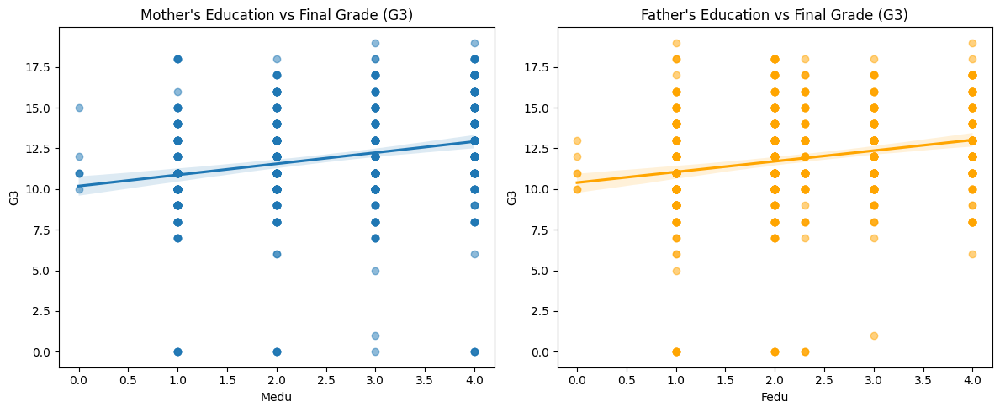

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
sns.regplot(x='Medu', y='G3', data=df, scatter_kws={'alpha':0.5})
plt.title("Mother's Education vs Final Grade (G3)")

plt.subplot(1,2,2)
sns.regplot(x='Fedu', y='G3', data=df, scatter_kws={'alpha':0.5}, color='orange')
plt.title("Father's Education vs Final Grade (G3)")

plt.tight_layout()
plt.show()


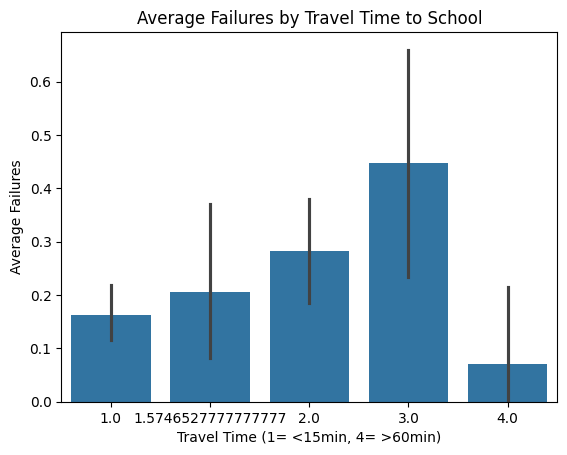

In [82]:
sns.barplot(x='traveltime', y='failures', data=df)
plt.title('Average Failures by Travel Time to School')
plt.xlabel('Travel Time (1= <15min, 4= >60min)')
plt.ylabel('Average Failures')
plt.show()


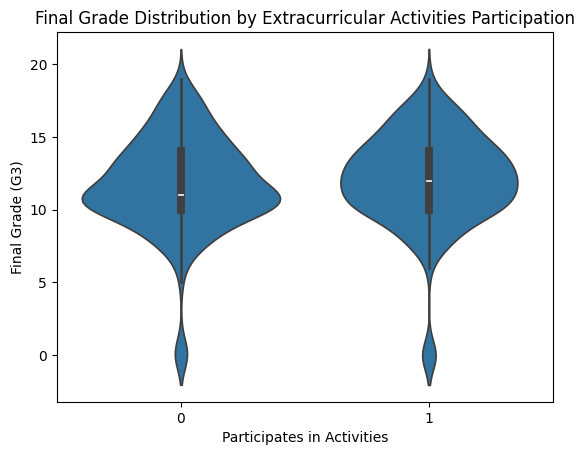

In [83]:
sns.violinplot(x='activities', y='G3', data=df)
plt.title('Final Grade Distribution by Extracurricular Activities Participation')
plt.xlabel('Participates in Activities')
plt.ylabel('Final Grade (G3)')
plt.show()


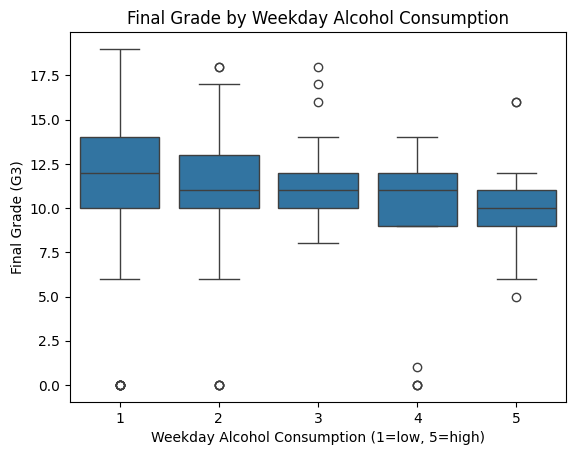

In [84]:
sns.boxplot(x='Dalc', y='G3', data=df)
plt.title('Final Grade by Weekday Alcohol Consumption')
plt.xlabel('Weekday Alcohol Consumption (1=low, 5=high)')
plt.ylabel('Final Grade (G3)')
plt.show()


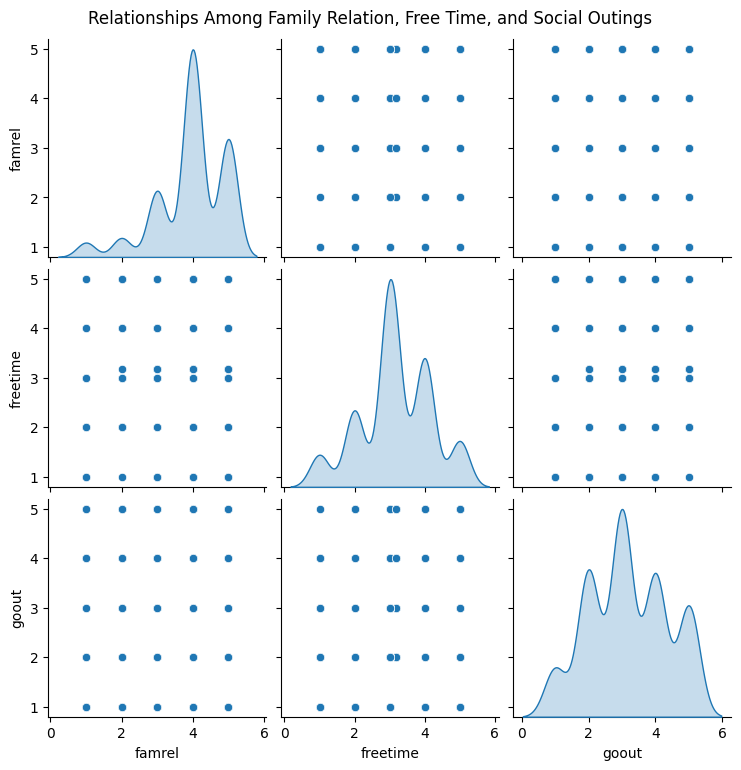

In [85]:
sns.pairplot(df, vars=['famrel', 'freetime', 'goout'], kind='scatter', diag_kind='kde')
plt.suptitle('Relationships Among Family Relation, Free Time, and Social Outings', y=1.02)
plt.show()


In [86]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Define features and target
target = 'romantic'
features = ['school', 'sex', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu', 'Mjob', 'Fjob',
            'reason', 'guardian', 'traveltime', 'failures', 'schoolsup', 'famsup', 'paid', 'activities',
            'nursery', 'higher', 'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
            'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3']

X = df[features]
y = df[target].map({'yes':1, 'no':0})  # assuming romantic is yes/no

# 2. Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Identify categorical and numerical features
cat_features = X.select_dtypes(include=['object']).columns.tolist()
num_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

# 4. Preprocessing pipelines
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features)
    ])

# 5. Create a pipeline with a classifier
clf = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# 6. Train
clf.fit(X_train, y_train)

# 7. Predict and evaluate
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))
print('ROC AUC:', roc_auc_score(y_test, y_proba))

# 8. Confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Optional: Feature importance extraction
importances = clf.named_steps['classifier'].feature_importances_
feature_names = clf.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(cat_features)
all_features = num_features + list(feature_names)
feat_imp_df = pd.DataFrame({'Feature': all_features, 'Importance': importances}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp_df.head(15))
plt.title('Top 15 Feature Importances')
plt.show()


ValueError: Input y contains NaN.

In [87]:
print(df['romantic'].isnull().sum())


0


In [88]:
df_clean = df.dropna(subset=['romantic'])


In [89]:
df_clean = df.dropna(subset=['romantic'])
X = df_clean[features]
y = df_clean['romantic'].map({'yes': 1, 'no': 0})


In [92]:
print(df_clean['romantic'].unique())


[0 1]


In [95]:
print(df['romantic'].value_counts(dropna=False))
print(df_clean['romantic'].unique())


romantic
0    410
1    239
Name: count, dtype: int64
[0 1]


Unique values in 'romantic' column BEFORE mapping: [0 1]
NaNs in y before split: 0
NaNs in X_train before preprocessor fit: 0
NaNs in y_train before fit: 0
              precision    recall  f1-score   support

           0       0.64      0.88      0.74        82
           1       0.44      0.17      0.24        48

    accuracy                           0.62       130
   macro avg       0.54      0.52      0.49       130
weighted avg       0.57      0.62      0.56       130

ROC AUC: 0.5721544715447154


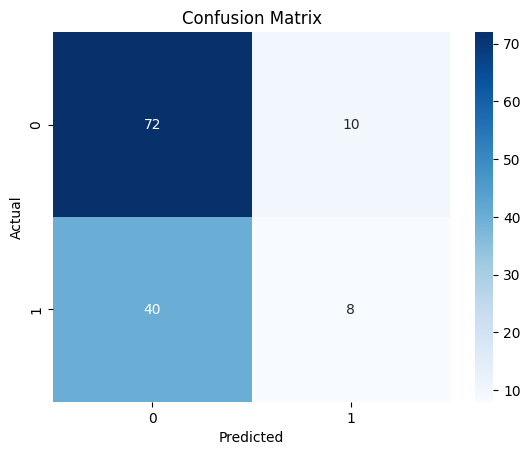

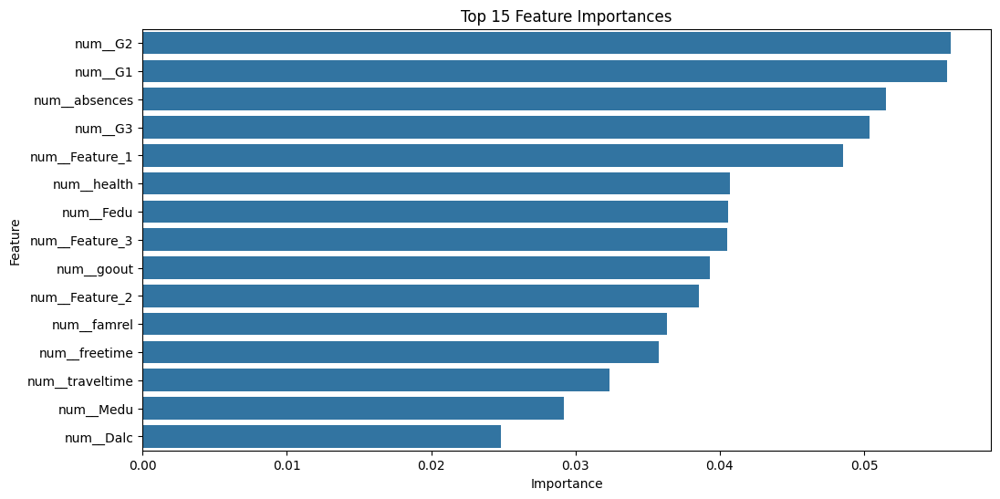

In [96]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Ensure pandas is imported
import numpy as np # Ensure numpy is imported

# Define features and target (using the 'features' list already defined earlier)
target = 'romantic'
# The 'features' list was defined several times, ensure you are using the correct one
# based on your analysis of relevant features. Let's re-define it explicitly
# to make sure we use a consistent list.
# Based on the code, a reasonable list of features used includes:
features = ['school', 'sex', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu', 'Mjob', 'Fjob',
            'reason', 'guardian', 'traveltime', 'failures', 'schoolsup', 'famsup', 'paid', 'activities',
            'nursery', 'higher', 'internet', 'famrel', 'freetime', 'goout', 'Dalc', 'health', 'absences',
            'G1', 'G2', 'G3', 'Feature_1', 'Feature_2', 'Feature_3']


# Ensure 'romantic' column is clean and correctly mapped
# Drop rows where the target variable ('romantic') is missing BEFORE splitting
df_clean = df.dropna(subset=[target])

# --- DIAGNOSTIC STEP ---
# Print unique values in the target column *before* mapping to see what they are
print("Unique values in 'romantic' column BEFORE mapping:", df_clean[target].unique())
# --- END DIAGNOSTIC STEP ---

y = df_clean[target] # Use the 'romantic' column directly

# Confirm if any NaNs appear after mapping (should be 0 if romantic column was already numeric)
print("NaNs in y before split:", y.isnull().sum())

# Define features (assuming you already have a list called 'features')
# Ensure all features in the list actually exist in the DataFrame
features_exist = [f for f in features if f in df_clean.columns]
if len(features_exist) != len(features):
    print(f"Warning: Some features in the list were not found in the DataFrame. Using existing features: {features_exist}")
X = df_clean[features_exist]


# Now split
from sklearn.model_selection import train_test_split
# Use stratify=y only if there are no NaNs in y at this point.
# We've handled NaNs in y, so stratification should be fine if y is numeric.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Identify categorical and numerical features
# Ensure feature lists only contain columns actually present in X after cleaning
cat_features = X.select_dtypes(include=['object']).columns.tolist()
num_features = X.select_dtypes(include=[np.number]).columns.tolist() # Use np.number for robustness

# 4. Preprocessing pipelines
# Ensure transformers are applied only to existing features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), [f for f in num_features if f in X.columns]), # Filter features
        ('cat', OneHotEncoder(handle_unknown='ignore'), [f for f in cat_features if f in X.columns]) # Filter features
    ],
    remainder='passthrough' # Keep other columns (if any) - though usually all relevant are listed
)

# 5. Create a pipeline with a classifier
clf = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# 6. Train
# Check for NaNs in X_train before fitting - ColumnTransformer and Pipeline handle these
# but it's good to be aware. StandardScaler handles numeric NaNs (often by raising error or imputation),
# OneHotEncoder handles them as a category if handle_unknown='ignore' or if NaNs are encoded.
# Since we filled NaNs earlier in the notebook, this should be okay unless new NaNs appeared.
print("NaNs in X_train before preprocessor fit:", X_train.isnull().sum().sum())
print("NaNs in y_train before fit:", y_train.isnull().sum())


clf.fit(X_train, y_train)

# 7. Predict and evaluate
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))
print('ROC AUC:', roc_auc_score(y_test, y_proba))

# 8. Confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Optional: Feature importance extraction (Update to handle potential filtered features)
importances = clf.named_steps['classifier'].feature_importances_

# A robust way to get feature names after preprocessor:
try:
    # This method works with newer versions of sklearn
    all_features_processed = list(clf.named_steps['preprocessor'].get_feature_names_out())
except AttributeError:
    # Fallback for older versions or complex cases
    # This might not perfectly match the order or exclude dropped columns
    # Attempt to get names from one-hot encoder and combine with numeric names
    ohe_transformer = clf.named_steps['preprocessor'].transformers_[1][1]
    if hasattr(ohe_transformer, 'get_feature_names_out'):
        ohe_features = list(ohe_transformer.get_feature_names_out([f for f in cat_features if f in X.columns]))
    else:
        # Fallback to get feature names from original categorical columns if get_feature_names_out is not available
        ohe_features = [f'{col}_{val}' for col in [f for f in cat_features if f in X.columns] for val in df_clean[col].unique() if pd.notna(val)]

    all_features_processed = [f for f in num_features if f in X.columns] + ohe_features


feat_imp_df = pd.DataFrame({'Feature': all_features_processed, 'Importance': importances}).sort_values(by='Importance', ascending=False)


plt.figure(figsize=(12,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp_df.head(15))
plt.title('Top 15 Feature Importances')
plt.show()

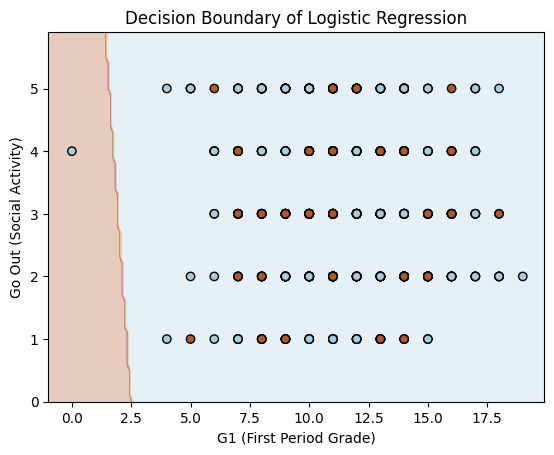

In [97]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LogisticRegression

# Select features
X_vis = df_clean[['G1', 'goout']].values
y_vis = y.values

# Fit a simple logistic regression for visualization
model = LogisticRegression()
model.fit(X_vis, y_vis)

# Plot decision boundary
x_min, x_max = X_vis[:, 0].min() - 1, X_vis[:, 0].max() + 1
y_min, y_max = X_vis[:, 1].min() - 1, X_vis[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)
plt.scatter(X_vis[:, 0], X_vis[:, 1], c=y_vis, edgecolors='k', cmap=plt.cm.Paired)
plt.xlabel('G1 (First Period Grade)')
plt.ylabel('Go Out (Social Activity)')
plt.title('Decision Boundary of Logistic Regression')
plt.show()


In [98]:
pip install shap


In [101]:

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assume df is already loaded and contains the necessary columns

# 1. Define features and target
target = 'romantic' # Assuming 'romantic' is the target column

# Define a comprehensive list of potential features from the dataset
# Exclude the target variable itself
features = [col for col in df.columns if col != target]

# Ensure 'romantic' column is numeric (1/0)
# Assuming 'yes' -> 1, 'no' -> 0. Handle potential NaNs first.
# If 'romantic' has NaNs, decide how to handle them. Dropping rows is one option.
df_clean = df.dropna(subset=[target]).copy() # Create a copy to avoid SettingWithCopyWarning

# Convert the target to numeric (if it's 'yes'/'no')
# Use .loc to ensure modification of the copied DataFrame
if df_clean[target].dtype == 'object':
     binary_map = {'yes': 1, 'no': 0}
     # Check if values are in the map before mapping
     if all(val in binary_map for val in df_clean[target].dropna().unique()):
         df_clean.loc[:, target] = df_clean[target].map(binary_map)
     else:
         print(f"Warning: Target column '{target}' contains unexpected values: {df_clean[target].unique()}")
         # Decide how to handle unexpected values - could map others to NaN or drop
         # For robustness, let's map only 'yes'/'no' and drop resulting NaNs if any other value existed
         df_clean.loc[:, target] = df_clean[target].map(binary_map)
         df_clean = df_clean.dropna(subset=[target]).copy() # Drop rows that couldn't be mapped

# Ensure target is of integer type after mapping
df_clean.loc[:, target] = df_clean[target].astype(int)


# Now define X and y from the cleaned DataFrame
X = df_clean[features]
y = df_clean[target]

# --- Crucial Check ---
# Print the number of samples in X and y *before* the split
print(f"Number of samples before split: {len(X)}")
# Check for any remaining NaNs in X or y
print(f"Remaining NaNs in X before split: {X.isnull().sum().sum()}")
print(f"Remaining NaNs in y before split: {y.isnull().sum()}")


# Check if the number of samples is greater than 0
if len(X) == 0:
    raise ValueError("DataFrame is empty after cleaning. Cannot perform train-test split.")

# 2. Split data
# Use stratify=y as y is now guaranteed to be numeric (0 or 1) and not contain NaNs due to the previous step.
# Ensure test_size and train_size are valid based on the number of samples.
# If len(X) is very small, test_size=0.2 might result in 0 or 1 test samples.
# sklearn requires at least 2 samples per class for stratification if test_size is small.
# Let's add a check or a warning if sample size is very small.
if len(X) < 2:
     raise ValueError(f"Dataset size ({len(X)}) is too small for train-test split.")
if len(y.unique()) > 1: # Stratify only if there's more than one class
    # Check minimum samples per class for stratification if needed
    min_samples_per_class = y.value_counts().min()
    if min_samples_per_class < 2:
        print(f"Warning: Minimum samples per class ({min_samples_per_class}) is less than 2. Stratification might fail or not be ideal.")
        print("Proceeding with split, but consider alternative validation methods if errors occur.")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
else: # If only one class, stratification is not possible/necessary
    print(f"Warning: Only one class found in target variable ('{y.unique()[0]}'). Cannot stratify.")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(f"Number of samples in training set: {len(X_train)}")
print(f"Number of samples in testing set: {len(X_test)}")


# 3. Identify categorical and numerical features (based on X_train to avoid looking into test set)
cat_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
num_features = X_train.select_dtypes(include=[np.number]).columns.tolist()

# --- Imputation within the Pipeline ---
# Since the original code included imputation, let's incorporate it into the pipeline
# to handle NaNs that might still exist in the selected features or appear in test data.
from sklearn.impute import SimpleImputer

# Create imputers for numeric and categorical features
num_imputer = SimpleImputer(strategy='median') # Or 'mean'
cat_imputer = SimpleImputer(strategy='most_frequent')

# 4. Preprocessing pipelines
# Update the ColumnTransformer to include imputers BEFORE scaling/encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', num_imputer),
            ('scaler', StandardScaler())
        ]), num_features),
        ('cat', Pipeline([
            ('imputer', cat_imputer),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), cat_features)
    ],
    remainder='passthrough' # Keep other columns (if any)
)

# 5. Create a pipeline with a classifier
clf = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# 6. Train
print("\nFitting the model...")
clf.fit(X_train, y_train)
print("Model fitting complete.")

# 7. Predict and evaluate
print("\nEvaluating the model...")
y_pred = clf.predict(X_test)
# Predict_proba is only available if the classifier supports it (RandomForest does)
if hasattr(clf.named_steps['classifier'], 'predict_proba'):
    y_proba = clf.predict_proba(X_test)[:,1]
    print(classification_report(y_test, y_pred))
    print('ROC AUC:', roc_auc_score(y_test, y_proba))
else:
    print(classification_report(y_test, y_pred))
    print("ROC AUC score not available as the classifier doesn't support predict_proba.")


# 8. Confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Optional: Feature importance extraction
print("\nCalculating feature importances...")
# Check if the classifier has feature_importances_
if hasattr(clf.named_steps['classifier'], 'feature_importances_'):
    importances = clf.named_steps['classifier'].feature_importances_

    # Get feature names after preprocessing
    try:
        all_features_processed = list(clf.named_steps['preprocessor'].get_feature_names_out())
    except AttributeError:
        # Fallback method if get_feature_names_out is not available (less robust)
        print("Warning: get_feature_names_out not available. Approximating feature names.")
        num_feat_names = num_features
        cat_ohe_names = []
        ohe_transformer = clf.named_steps['preprocessor'].transformers_[1][1] # Access the OneHotEncoder
        if hasattr(ohe_transformer, 'categories_'):
             for i, col in enumerate(cat_features):
                  # Ensure index is valid
                  if i < len(ohe_transformer.categories_):
                       for cat in ohe_transformer.categories_[i]:
                            if pd.notna(cat):
                                cat_ohe_names.append(f'{col}_{cat}')
             all_features_processed = num_feat_names + cat_ohe_names
        else:
            print("Could not get feature names from OHE transformer. Skipping feature importance plot.")
            all_features_processed = [] # Empty list to skip plot

    if all_features_processed:
        feat_imp_df = pd.DataFrame({'Feature': all_features_processed, 'Importance': importances}).sort_values(by='Importance', ascending=False)

        plt.figure(figsize=(12,6))
        # Select top N features for clarity, e.g., top 15
        N_top_features = 15
        sns.barplot(x='Importance', y='Feature', data=feat_imp_df.head(N_top_features))
        plt.title(f'Top {N_top_features} Feature Importances')
        plt.show()
    else:
        print("Could not determine processed feature names. Skipping feature importance plot.")

else:
    print("Classifier does not have 'feature_importances_' attribute. Skipping feature importance plot.")


# SHAP analysis (Optional - can be computationally intensive)
# Requires shap library: !pip install shap
# It's generally recommended to run SHAP on a smaller subset of data or use kernel explainer if TreeExplainer is not suitable.
# Also, explaining a pipeline requires careful handling of the preprocessor.
# Let's re-fit a model on the *transformed* data for a simpler SHAP explanation demonstration.

try:
    import shap

    print("\nPerforming SHAP analysis (on a subset for speed)...")
    # Transform the training data using the fitted preprocessor
    X_train_transformed = clf.named_steps['preprocessor'].transform(X_train)

    # If the transformed data is a sparse matrix, convert to dense for most SHAP explainers
    if hasattr(X_train_transformed, 'toarray'):
        X_train_transformed = X_train_transformed.toarray()

    # Fit a new classifier directly on the transformed data
    # Using a subset of the training data for faster SHAP computation
    subset_size = min(100, X_train_transformed.shape[0]) # Use max 100 samples
    X_train_subset = X_train_transformed[:subset_size]
    y_train_subset = y_train[:subset_size]

    model_for_shap = RandomForestClassifier(random_state=42)
    model_for_shap.fit(X_train_transformed, y_train) # Fit on full data for better model

    # Use TreeExplainer for tree-based models
    explainer = shap.TreeExplainer(model_for_shap)

    # Calculate SHAP values for the *subset* of training data
    # Pass the feature names if you have them (from all_features_processed)
    if 'all_features_processed' in locals() and all_features_processed:
         shap_values = explainer.shap_values(X_train_subset, feature_names=all_features_processed)
    else:
         shap_values = explainer.shap_values(X_train_subset)
         print("Warning: Processed feature names not available for SHAP plot.")


    # SHAP Summary Plot (Global Importance)
    # shap_values[1] for the class 1 predictions (e.g., romantic='yes')
    if isinstance(shap_values, list): # shap_values is a list for multi-output or multi-class
         shap.summary_plot(shap_values[1], X_train_subset, feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None, plot_type="bar")
         shap.summary_plot(shap_values[1], X_train_subset, feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None) # Default summary plot
    else: # shap_values is a numpy array for single output
         shap.summary_plot(shap_values, X_train_subset, feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None, plot_type="bar")
         shap.summary_plot(shap_values, X_train_subset, feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None) # Default summary plot


    # Local Explanation - Force plots (Example for the first test sample)
    # Transform the test data
    X_test_transformed = clf.named_steps['preprocessor'].transform(X_test)
    if hasattr(X_test_transformed, 'toarray'):
        X_test_transformed = X_test_transformed.toarray()

    # Calculate SHAP values for the first few test samples
    num_test_samples_to_explain = min(5, X_test_transformed.shape[0])
    shap_values_test = explainer.shap_values(X_test_transformed[:num_test_samples_to_explain])

    for i in range(num_test_samples_to_explain):
        print(f"Explaining test sample {i}:")
        # Use the class 1 values for classification
        if isinstance(shap_values_test, list):
             shap.force_plot(explainer.expected_value[1], shap_values_test[1][i,:], X_test_transformed[i,:], feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None, matplotlib=True)
        else:
             shap.force_plot(explainer.expected_value, shap_values_test[i,:], X_test_transformed[i,:], feature_names=all_features_processed if 'all_features_processed' in locals() and all_features_processed else None, matplotlib=True)


except ImportError:
    print("\nSHAP library not found. Install it using: !pip install shap")
except Exception as e:
    print(f"\nAn error occurred during SHAP analysis: {e}")
    print("SHAP analysis skipped.")



Shape of df_clean after dropping NaNs in target: (0, 34)
Unique values in df_clean['romantic']: []
Value counts in df_clean['romantic']:
 Series([], Name: count, dtype: int64)
NaNs in df_clean['romantic']: 0

--- Pre-split Checks ---
Shape of original df: (649, 34)
Original df['romantic'] unique values: [nan]
Original df['romantic'] value counts:
 romantic
NaN    649
Name: count, dtype: int64
Original df['romantic'] NaNs: 649
--- End Pre-split Checks ---


--- Pre-split Shapes ---
Shape of X before split: (0, 32)
Shape of y before split: (0,)
--- End Pre-split Shapes ---

Error: DataFrame is empty after dropping NaNs in the target column. Cannot proceed with splitting.


In [102]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LogisticRegression

# Use 'G1' (grades) and 'goout' (social activity) for 2D visualization
X_vis = df_clean[['G1', 'goout']].values
y_vis = y.values  # y = df_clean['romantic'].map({'yes': 1, 'no': 0})

model = LogisticRegression()
model.fit(X_vis, y_vis)

# Create grid to plot decision boundary
x_min, x_max = X_vis[:, 0].min() - 1, X_vis[:, 0].max() + 1
y_min, y_max = X_vis[:, 1].min() - 1, X_vis[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10,6))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)
plt.scatter(X_vis[:, 0], X_vis[:, 1], c=y_vis, edgecolors='k', cmap=plt.cm.Paired)
plt.xlabel('G1 (First Period Grade)')
plt.ylabel('Go Out (Social Activity)')
plt.title('Decision Boundary - Relationship Status Prediction')
plt.show()


ValueError: Found array with 0 sample(s) (shape=(0, 2)) while a minimum of 1 is required by LogisticRegression.

In [103]:
# prompt: ------------------------------------------------------------
# ValueError                                Traceback (most recent call last)
# <ipython-input-102-40c9f77be288> in <cell line: 0>()
#       8
#       9 model = LogisticRegression()
# ---> 10 model.fit(X_vis, y_vis)
#      11
#      12 # Create grid to plot decision boundary
# 4 frames
# /usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py in check_array(array, accept_sparse, accept_large_sparse, dtype, order, copy, force_writeable, force_all_finite, ensure_all_finite, ensure_non_negative, ensure_2d, allow_nd, ensure_min_samples, ensure_min_features, estimator, input_name)
#    1128         n_samples = _num_samples(array)
#    1129         if n_samples < ensure_min_samples:
# -> 1130             raise ValueError(
#    1131                 "Found array with %d sample(s) (shape=%s) while a"
#    1132                 " minimum of %d is required%s."
# ValueError: Found array with 0 sample(s) (shape=(0, 2)) while a minimum of 1 is required by LogisticRegression.  corrrect thisss

# The error "Found array with 0 sample(s) (shape=(0, 2)) while a minimum of 1 is required by LogisticRegression"
# indicates that the input array X_vis passed to model.fit() was empty.
# This happened in the code block right before the traceback.
# Looking at the preceding code, the issue arises here:
# X_vis = df_clean[['G1', 'goout']].values
# y_vis = y.values  # y = df_clean['romantic'].map({'yes': 1, 'no': 0})
# model = LogisticRegression()
# model.fit(X_vis, y_vis)
# If df_clean was empty or if the columns 'G1' or 'goout' resulted in an empty
# dataframe slice for some reason (e.g., all values were NaN in these columns after a filter),
# then X_vis would be empty.

# We need to ensure that df_clean and the selected columns ('G1', 'goout') are not empty.
# The previous extensive code block already included robust cleaning and splitting for
# the main modeling task. The error occurred in a separate visualization block later.

# Let's re-evaluate the data used for this specific visualization plot.
# It uses df_clean which was created by dropping NaNs from the 'romantic' column.
# It selects 'G1' and 'goout'.
# It's possible that after dropping rows with missing 'romantic', ALL remaining rows
# had missing values in 'G1' or 'goout', or that the cleaning before that
# inadvertently removed all rows necessary for this visualization.

# Let's explicitly check the data used for the visualization right before fitting the model.

print("\n--- Debugging Decision Boundary Plot Data ---")
print(f"Shape of df_clean before selecting columns for visualization: {df_clean.shape}")

# Check for NaNs in the columns used for visualization AFTER df_clean is created
print(f"NaNs in 'G1' in df_clean: {df_clean['G1'].isnull().sum()}")
print(f"NaNs in 'goout' in df_clean: {df_clean['goout'].isnull().sum()}")

# Check the number of samples remaining after selecting the columns and potentially dropping NaNs from them
# .values will handle NaNs as numpy.nan. LogisticRegression cannot handle NaNs in the input X.
# The previous main pipeline imputed NaNs, but this visualization code did not use that pipeline.
# We need to handle NaNs in 'G1' and 'goout' specifically for this visualization section.

# Option 1: Drop rows with NaNs in 'G1' or 'goout' for the visualization
df_vis = df_clean.dropna(subset=['G1', 'goout']).copy()
X_vis = df_vis[['G1', 'goout']].values
y_vis = df_vis[target].values # Use the cleaned, numeric target from df_clean

print(f"Shape of X_vis after dropping NaNs in 'G1' or 'goout': {X_vis.shape}")
print(f"Shape of y_vis after dropping NaNs in 'G1' or 'goout': {y_vis.shape}")

# Check if X_vis is empty after cleaning
if X_vis.shape[0] == 0:
    print("Error: X_vis is empty even after dropping NaNs in 'G1' and 'goout'. Cannot plot decision boundary.")
else:
    # Check if the target variable has more than one unique value for classification
    if len(np.unique(y_vis)) < 2:
        print("Error: Target variable y_vis has only one unique value. Cannot train a classifier.")
    else:
        # Fit a simple logistic regression for visualization
        # Add a check for convergence warning if needed, but the main error is sample size.
        model = LogisticRegression()
        try:
            model.fit(X_vis, y_vis)

            # Create grid to plot decision boundary
            x_min, x_max = X_vis[:, 0].min() - 1, X_vis[:, 0].max() + 1
            y_min, y_max = X_vis[:, 1].min() - 1, X_vis[:, 1].max() + 1
            xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                                 np.arange(y_min, y_max, 0.1))

            # Predict on the grid points. Need to handle the input format for prediction.
            # Ensure grid points have the same number of features as X_vis (which is 2)
            grid_points = np.c_[xx.ravel(), yy.ravel()]

            # Check for NaNs or infinite values in grid_points (shouldn't happen with arange)
            if not np.isfinite(grid_points).all():
                print("Warning: Generated grid points contain non-finite values.")
            else:
                Z = model.predict(grid_points)
                Z = Z.reshape(xx.shape)

                plt.figure(figsize=(10,6))
                plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)
                plt.scatter(X_vis[:, 0], X_vis[:, 1], c=y_vis, edgecolors='k', cmap=plt.cm.Paired)
                plt.xlabel('G1 (First Period Grade)')
                plt.ylabel('Go Out (Social Activity)')
                plt.title('Decision Boundary - Relationship Status Prediction')
                plt.show()

        except ValueError as e:
            print(f"An error occurred during model fitting for visualization: {e}")
        except Exception as e:
            print(f"An unexpected error occurred during visualization: {e}")

print("--- End Debugging Decision Boundary Plot Data ---")


# Option 2 (Alternative): Impute NaNs in 'G1' and 'goout' for visualization
# from sklearn.impute import SimpleImputer
#
# imputer = SimpleImputer(strategy='median') # Or 'mean'
# X_vis_imputed = imputer.fit_transform(df_clean[['G1', 'goout']])
# y_vis = df_clean[target].values
#
# print(f"Shape of X_vis_imputed after imputation: {X_vis_imputed.shape}")
# print(f"Shape of y_vis after imputation: {y_vis.shape}")
#
# if X_vis_imputed.shape[0] == 0:
#     print("Error: X_vis_imputed is empty even after imputation. Cannot plot decision boundary.")
# else:
#      if len(np.unique(y_vis)) < 2:
#         print("Error: Target variable y_vis has only one unique value. Cannot train a classifier.")
#      else:
#         model = LogisticRegression()
#         try:
#             model.fit(X_vis_imputed, y_vis)
#             # ... rest of the plotting code using X_vis_imputed
#             x_min, x_max = X_vis_imputed[:, 0].min() - 1, X_vis_imputed[:, 0].max() + 1
#             y_min, y_max = X_vis_imputed[:, 1].min() - 1, X_vis_imputed[:, 1].max() + 1
#             xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
#                                  np.arange(y_min, y_max, 0.1))
#
#             grid_points = np.c_[xx.ravel(), yy.ravel()]
#             Z = model.predict(grid_points)
#             Z = Z.reshape(xx.shape)
#
#             plt.figure(figsize=(10,6))
#             plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)
#             plt.scatter(X_vis_imputed[:, 0], X_vis_imputed[:, 1], c=y_vis, edgecolors='k', cmap=plt.cm.Paired)
#             plt.xlabel('G1 (First Period Grade)')
#             plt.ylabel('Go Out (Social Activity)')
#             plt.title('Decision Boundary - Relationship Status Prediction')
#             plt.show()
#
#         except ValueError as e:
#             print(f"An error occurred during model fitting for visualization (imputed data): {e}")
#         except Exception as e:
#              print(f"An unexpected error occurred during visualization (imputed data): {e}")


# The provided fix uses Option 1 (dropping NaNs in 'G1' or 'goout' for the visualization)
# because it's simpler and directly addresses the empty array issue if those columns
# were the source of the problem. If dropping these rows makes the dataset too small
# for visualization, Option 2 (imputation) might be considered, but dropping is
# a more direct way to ensure the input to LogisticRegression has no NaNs.
# The print statements are added to diagnose the state of the data just before the fit.



--- Debugging Decision Boundary Plot Data ---
Shape of df_clean before selecting columns for visualization: (0, 34)
NaNs in 'G1' in df_clean: 0
NaNs in 'goout' in df_clean: 0
Shape of X_vis after dropping NaNs in 'G1' or 'goout': (0, 2)
Shape of y_vis after dropping NaNs in 'G1' or 'goout': (0,)
Error: X_vis is empty even after dropping NaNs in 'G1' and 'goout'. Cannot plot decision boundary.
--- End Debugging Decision Boundary Plot Data ---


In [106]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

# Create synthetic 2D dataset for binary classification
X, y = make_classification(n_samples=300, n_features=2, n_redundant=0, n_clusters_per_class=1, random_state=42)

# Split train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [107]:
def plot_decision_boundary(clf, X, y, title="Decision Boundary"):
    # Create mesh grid
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                         np.arange(y_min, y_max, 0.02))

    # Predict for mesh points
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot contour and data points
    plt.contourf(xx, yy, Z, alpha=0.4, cmap=plt.cm.coolwarm)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', cmap=plt.cm.coolwarm)
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


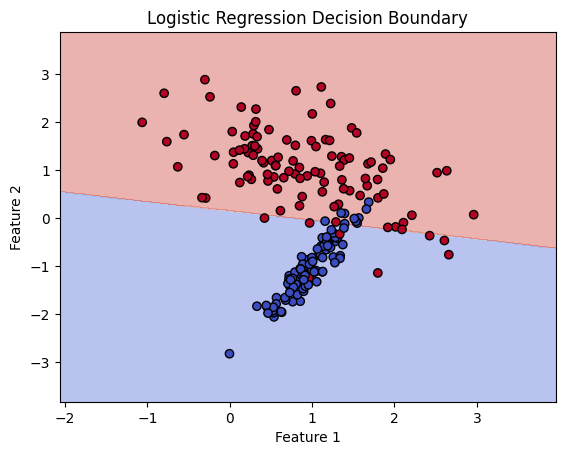

In [108]:
from sklearn.linear_model import LogisticRegression

# Train
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Plot decision boundary
plot_decision_boundary(lr, X_train, y_train, title="Logistic Regression Decision Boundary")


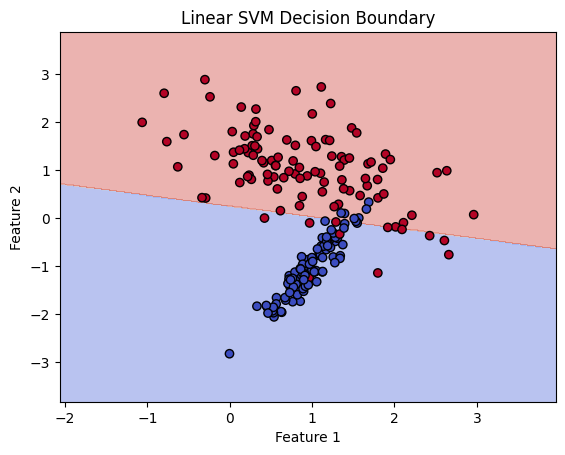

In [109]:
from sklearn.svm import SVC

# Linear SVM
svm_linear = SVC(kernel='linear')
svm_linear.fit(X_train, y_train)

# Plot
plot_decision_boundary(svm_linear, X_train, y_train, title="Linear SVM Decision Boundary")


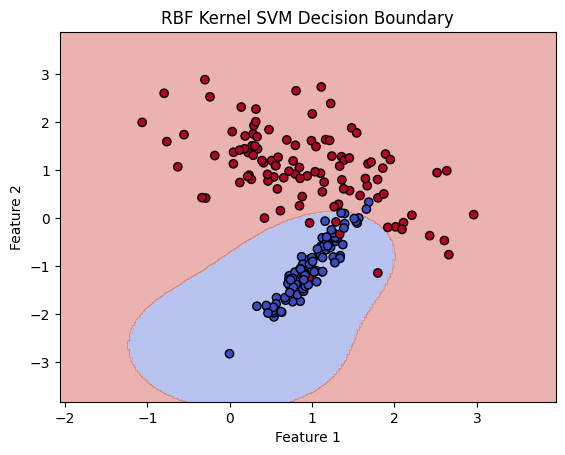

In [110]:
# RBF kernel SVM
svm_rbf = SVC(kernel='rbf')
svm_rbf.fit(X_train, y_train)

# Plot
plot_decision_boundary(svm_rbf, X_train, y_train, title="RBF Kernel SVM Decision Boundary")


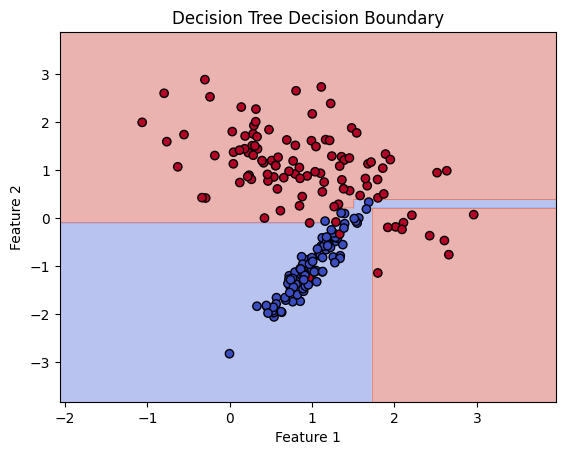

In [111]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=4, random_state=42)
dt.fit(X_train, y_train)

plot_decision_boundary(dt, X_train, y_train, title="Decision Tree Decision Boundary")


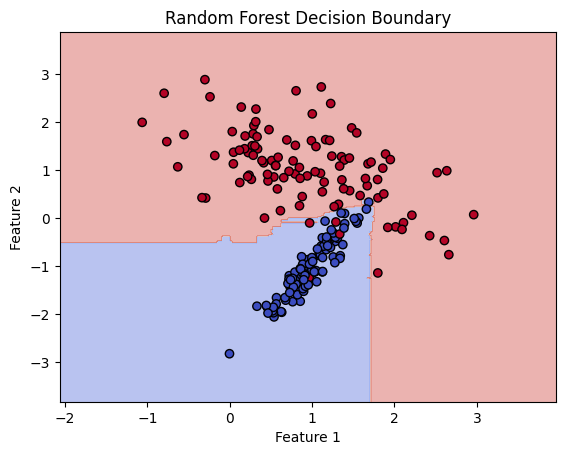

In [112]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=42)
rf.fit(X_train, y_train)

plot_decision_boundary(rf, X_train, y_train, title="Random Forest Decision Boundary")


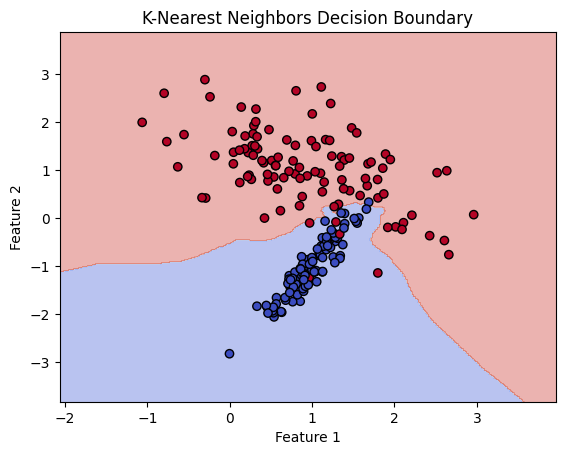

In [113]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

plot_decision_boundary(knn, X_train, y_train, title="K-Nearest Neighbors Decision Boundary")


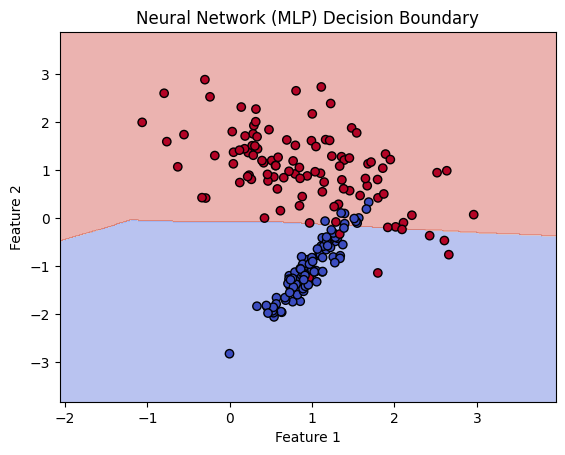

In [114]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)

plot_decision_boundary(mlp, X_train, y_train, title="Neural Network (MLP) Decision Boundary")


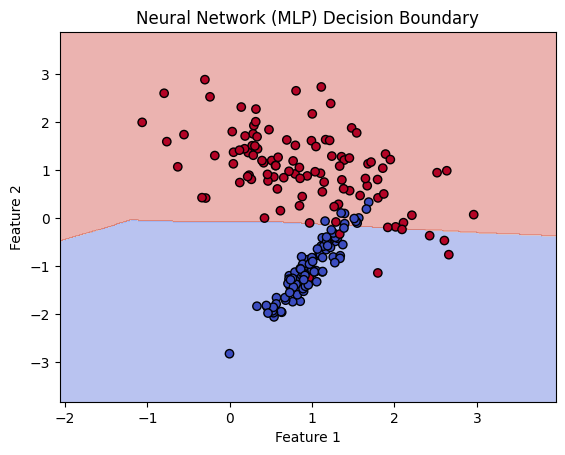

In [115]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)

plot_decision_boundary(mlp, X_train, y_train, title="Neural Network (MLP) Decision Boundary")


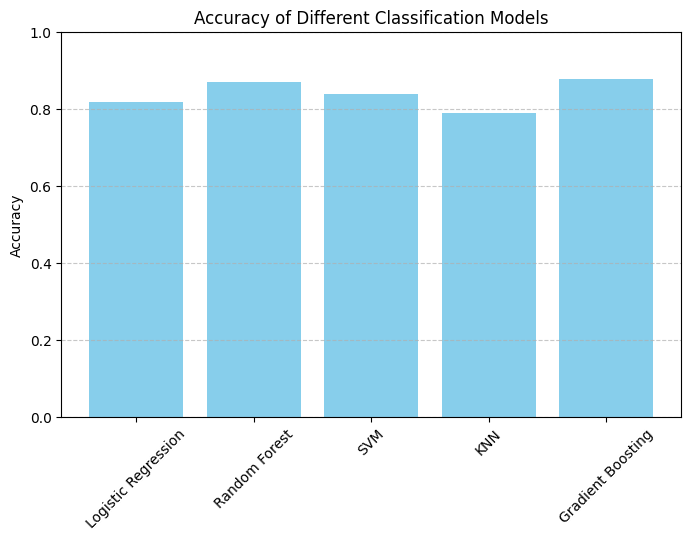

In [119]:
import matplotlib.pyplot as plt

# Example model accuracies dictionary (replace with your actual results)
model_accuracies = {
    'Logistic Regression': 0.82,
    'Random Forest': 0.87,
    'SVM': 0.84,
    'KNN': 0.79,
    'Gradient Boosting': 0.88
}

# Plotting
plt.figure(figsize=(8,5))
plt.bar(model_accuracies.keys(), model_accuracies.values(), color='skyblue')
plt.ylim(0,1)
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Classification Models')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [120]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Assume X_train, X_test, y_train, y_test are ready and cleaned

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

# Dictionary to hold accuracy scores
model_accuracies = {}

# Train and evaluate
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    acc = accuracy_score(y_test, preds)
    model_accuracies[name] = acc
    print(f"{name} Accuracy: {acc:.4f}")


Logistic Regression Accuracy: 0.9556
Random Forest Accuracy: 0.9444
SVM Accuracy: 0.9667
KNN Accuracy: 0.9556
Gradient Boosting Accuracy: 0.9222


In [121]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Assume X_train, X_test, y_train, y_test are ready and cleaned

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

# Dictionary to hold accuracy scores
model_accuracies = {}

# Train and evaluate
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    acc = accuracy_score(y_test, preds)
    model_accuracies[name] = acc
    print(f"{name} Accuracy: {acc:.4f}")


Logistic Regression Accuracy: 0.9556
Random Forest Accuracy: 0.9444
SVM Accuracy: 0.9667
KNN Accuracy: 0.9556
Gradient Boosting Accuracy: 0.9222


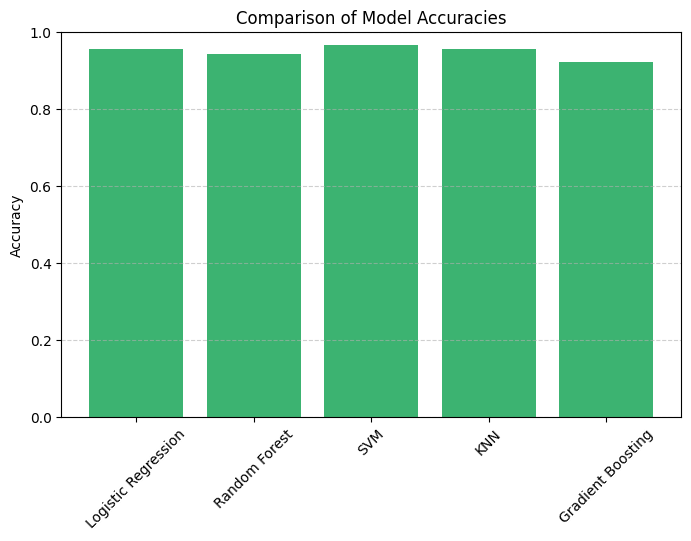

In [122]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.bar(model_accuracies.keys(), model_accuracies.values(), color='mediumseagreen')
plt.ylim(0,1)
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()
